In [1]:
import os
os.environ["CRDS_PATH"] = os.path.expanduser("~/crds_cache")
os.makedirs(os.environ["CRDS_PATH"], exist_ok=True)

os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"
os.environ["CRDS_CONTEXT"] = "jwst_1460.pmap"

from astropy.table import Table
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astroquery.svo_fps import SvoFps
from astropy.wcs import WCS
from astropy.io import fits
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc
from dust_extinction.parameter_averages import CCM89

def get_mag(catalog, ww, filtername='f140m' ):
    print(ww.proj_plane_pixel_area())
    
    flux= (catalog['flux_fit_' + filtername] * u.MJy/u.sr * ww.proj_plane_pixel_area()).to(u.Jy)
    eflux_jy = (catalog['flux_err_' + filtername] * u.MJy/u.sr *  ww.proj_plane_pixel_area()).to(u.Jy)

    jfilts = SvoFps.get_filter_list('JWST')
    jfilts.add_index('filterID')
    wav = int(filtername[1:-1])

    zeropoint_ab = 3631 * u.Jy  # Default to AB magnitude zero point
 
    if wav < 500:

        zeropoint_vega = u.Quantity(jfilts.loc[f'JWST/NIRCam.{filtername.upper()}']['ZeroPoint'], u.Jy)
    else:
        zeropoint_vega = u.Quantity(jfilts.loc[f'JWST/MIRI.{filtername.upper()}']['ZeroPoint'], u.Jy)
   
    abmag = -2.5 * np.log10(flux / zeropoint_ab) * u.mag
    abmag_err = 2.5 / np.log(10) * np.abs(eflux_jy / flux) * u.mag

    vegamag = -2.5 * np.log10(flux / zeropoint_vega) * u.mag
    vegamag_err = 2.5 / np.log(10) * np.abs(eflux_jy / flux) * u.mag

    return  vegamag, vegamag_err, abmag, abmag_err



catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/final_catalog_refined.fits')
print(catalog.colnames)
image_filenames ={
    "f140m": "/orange/adamginsburg/jwst/w51/F140M/pipeline/jw06151-o001_t001_nircam_clear-f140m-merged_i2d.fits",
    "f150w": "/orange/adamginsburg/jwst/w51/F150W/pipeline/jw06151-o001_t001_nircam_clear-f150w-merged_i2d.fits",
    "f162m": "/orange/adamginsburg/jwst/w51/F162M/pipeline/jw06151-o001_t001_nircam_clear-f162m-merged_i2d.fits",
    "f182m": "/orange/adamginsburg/jwst/w51/F182M/pipeline/jw06151-o001_t001_nircam_clear-f182m-merged_i2d.fits",
    "f187n": "/orange/adamginsburg/jwst/w51/F187N/pipeline/jw06151-o001_t001_nircam_clear-f187n-merged_i2d.fits",
    "f210m": "/orange/adamginsburg/jwst/w51/F210M/pipeline/jw06151-o001_t001_nircam_clear-f210m-merged_i2d.fits",
    "f335m": "/orange/adamginsburg/jwst/w51/F335M/pipeline/jw06151-o001_t001_nircam_clear-f335m-merged_i2d.fits",
    "f360m": "/orange/adamginsburg/jwst/w51/F360M/pipeline/jw06151-o001_t001_nircam_clear-f360m-merged_i2d.fits",
    "f405n": "/orange/adamginsburg/jwst/w51/F405N/pipeline/jw06151-o001_t001_nircam_clear-f405n-merged_i2d.fits",
    "f410m": "/orange/adamginsburg/jwst/w51/F410M/pipeline/jw06151-o001_t001_nircam_clear-f410m-merged_i2d.fits", # weird, the filename is different from what is downloaded with the STScI pipeline...
    "f480m": "/orange/adamginsburg/jwst/w51/F480M/pipeline/jw06151-o001_t001_nircam_clear-f480m-merged_i2d.fits",
    "f560w": "/orange/adamginsburg/jwst/w51/F560W/pipeline/jw06151-o002_t001_miri_f560w_i2d.fits",
    "f770w": "/orange/adamginsburg/jwst/w51/F770W/pipeline/jw06151-o002_t001_miri_f770w_i2d.fits",
    "f1000w": "/orange/adamginsburg/jwst/w51/F1000W/pipeline/jw06151-o002_t001_miri_f1000w_i2d.fits",
    "f1280w": "/orange/adamginsburg/jwst/w51/F1280W/pipeline/jw06151-o002_t001_miri_f1280w_i2d.fits",
    "f2100w": "/orange/adamginsburg/jwst/w51/F2100W/pipeline/jw06151-o002_t001_miri_f2100w_i2d.fits",
    
}

f140m_header = fits.getheader(image_filenames['f140m'], ext=('SCI', 1))
f162m_header = fits.getheader(image_filenames['f162m'], ext=('SCI', 1))
f182m_header = fits.getheader(image_filenames['f182m'], ext=('SCI', 1))
f210m_header = fits.getheader(image_filenames['f210m'], ext=('SCI', 1))
f335m_header = fits.getheader(image_filenames['f335m'], ext=('SCI', 1))
f360m_header = fits.getheader(image_filenames['f360m'], ext=('SCI', 1))
f405n_header = fits.getheader(image_filenames['f405n'], ext=('SCI', 1))
f410m_header = fits.getheader(image_filenames['f410m'], ext=('SCI', 1))
f480m_header = fits.getheader(image_filenames['f480m'], ext=('SCI', 1))
f560w_header = fits.getheader(image_filenames['f560w'], ext=('SCI', 1))
f770w_header = fits.getheader(image_filenames['f770w'], ext=('SCI', 1))
f1000w_header = fits.getheader(image_filenames['f1000w'], ext=('SCI', 1))
f1280w_header = fits.getheader(image_filenames['f1280w'], ext=('SCI', 1))
f2100w_header = fits.getheader(image_filenames['f2100w'], ext=('SCI', 1))



f140m_mag = get_mag(catalog, WCS(f140m_header), filtername='f140m')
f162m_mag = get_mag(catalog, WCS(f162m_header), filtername='f162m')
f182m_mag = get_mag(catalog, WCS(f182m_header), filtername='f182m')
f210m_mag = get_mag(catalog, WCS(f210m_header), filtername='f210m')
f335m_mag = get_mag(catalog, WCS(f335m_header), filtername='f335m')
f360m_mag = get_mag(catalog, WCS(f360m_header), filtername='f360m')
f405n_mag = get_mag(catalog, WCS(f405n_header), filtername='f405n')
f410m_mag = get_mag(catalog, WCS(f410m_header), filtername='f410m')
f480m_mag = get_mag(catalog, WCS(f480m_header), filtername='f480m')
f560w_mag = get_mag(catalog, WCS(f560w_header), filtername='f560w')
f770w_mag = get_mag(catalog, WCS(f770w_header), filtername='f770w')
f1000w_mag = get_mag(catalog, WCS(f1000w_header), filtername='f1000w')
f1280w_mag = get_mag(catalog, WCS(f1280w_header), filtername='f1280w')
f2100w_mag = get_mag(catalog, WCS(f2100w_header), filtername='f2100w')

f187n_header = fits.getheader(image_filenames['f187n'], ext=('SCI', 1))
f187n_mag = get_mag(catalog, WCS(f187n_header), filtername='f187n')


from dust_extinction.averages import RL85_MWGC, CT06_MWGC
from dust_extinction.parameter_averages import CCM89
import astropy.constants as const

ext = RL85_MWGC()
ext = CT06_MWLoc()
def plot_extvec_cmd(ax, color1, mag1, ext=RL85_MWGC(), extvec_scale=200, start=None,
                    color='y', head_width=0.5, color1_data=None, mag1_data=None, label=None):
    def get_wave(c):
        if c == '410m405': return 4.10*u.um
        if c == '405m410': return 4.05*u.um
        if c == 'Hmag': return 1.634*u.um
        if c == 'Ksmag': return 2.143527*u.um
        return int(c[1:-1])/100*u.um

    w1 = get_wave(color1[0])
    w2 = get_wave(color1[1])
    w3 = get_wave(mag1[0])

    if w1 > w2:
        w1, w2 = w2, w1
        color1 = color1[::-1]
    print(w1,w2,w3)

    # Only plot if all are in valid range
    try:
        e_1 = ext(1/w1) * extvec_scale
        e_2 = ext(1/w2) * extvec_scale
        e_3 = ext(1/w3) * extvec_scale
    except ValueError as e:
        print(f"Extinction vector not plotted: {e}")
        return
    print(w1,w2,w3)
    print(e_1, e_2, e_3)
    if start == None:
        mean_color1 = np.nanmean(color1_data)
        mean_mag1 = np.nanmean(mag1_data)
        std_color1 = np.nanstd(color1_data)
        std_mag1 = np.nanstd(mag1_data)
        if e_1 - e_2 < 0:
            std_color1 *= -1
        
    
        start2 = (mean_color1 + 2*std_color1, mean_mag1 + 2*std_mag1)
    else:
        start2 = start
    
    # Strip units for plotting if present
    if hasattr(start2[0], 'value'):
        start2_x = start2[0].value
        start2_y = start2[1].value
    else:
        start2_x = start2[0]
        start2_y = start2[1]

    ax.annotate(f'$A_V={extvec_scale}$', xy=(start2_x + (e_1 - e_2), start2_y + e_3),
                xytext=(start2_x, start2_y),
                arrowprops=dict(arrowstyle='-|>', color=color,
                                shrinkA=0, shrinkB=0,
                                mutation_scale=20, linewidth=1.5))
    ax.plot([], [], color=color, marker='>', markersize=8,
            label=f'{label}', linestyle='-', linewidth=2)



imgsavedir = '/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/plots/cmds/'
filters = {
    'f140m': f140m_mag,
    'f162m': f162m_mag,
    'f182m': f182m_mag,
    'f187n': f187n_mag,
    'f210m': f210m_mag,
    'f335m': f335m_mag,
    'f360m': f360m_mag,
    'f405n': f405n_mag,
    'f410m': f410m_mag,
    'f480m': f480m_mag,
    'f560w': f560w_mag,
    'f770w': f770w_mag,
    'f1000w': f1000w_mag,
    'f1280w': f1280w_mag,
    'f2100w': f2100w_mag,
}
filter_names = list(filters.keys())

def get_line_excess(catalog, narrow, wide):
    # --- Convert catalog MJy/sr → Jy ---
    ww_narrow = WCS(fits.getheader(image_filenames[narrow], ext=('SCI', 1)))
    ww_wide = WCS(fits.getheader(image_filenames[wide], ext=('SCI', 1)))

    data_narrow = (catalog['flux_fit_' + narrow] * u.MJy/u.sr *
                   ww_narrow.proj_plane_pixel_area()).to(u.Jy)
    data_wide = (catalog['flux_fit_' + wide] * u.MJy/u.sr *
                 ww_wide.proj_plane_pixel_area()).to(u.Jy)

    # --- Load filter curves ---
    tab_n = SvoFps.get_transmission_data(f'JWST/NIRCAM.{narrow}')
    tab_w = SvoFps.get_transmission_data(f'JWST/NIRCAM.{wide}')

    wave_n = tab_n['Wavelength'] * u.AA
    trans_n = tab_n['Transmission']

    wave_w = tab_w['Wavelength'] * u.AA
    trans_w = tab_w['Transmission']

    # --- Interpolate narrow onto wide grid ---
    trans_n_interp = np.interp(wave_w.value, wave_n.value, trans_n)

    # --- Fractional overlap (proper integral) ---
    num = np.trapezoid(
    (trans_w / trans_w.max()) * (trans_n_interp / trans_n.max()),
    wave_w.value
    )
    den = np.trapezoid(trans_w / trans_w.max(), wave_w.value)
    f = num / den

    if np.isclose(f, 1.0):
        return None, None

    # --- Continuum & line (still in Jy = F_nu) ---
    cont_nu = (data_wide - data_narrow * f) / (1 - f)
    line_nu = data_narrow - cont_nu

    width_narrow = np.trapezoid(trans_n / trans_n.max(), wave_n.value) * u.AA

    # --- Equivalent Width ---
    with np.errstate(divide='ignore', invalid='ignore'):
        ew = (line_nu / cont_nu) * width_narrow

    return line_nu.value, ew.to_value(u.AA)

paa_excess,  paa_excess_ew = get_line_excess(catalog, 'f187n', 'f182m')
bra_excess,  bra_excess_ew = get_line_excess(catalog, 'f405n', 'f410m')

print('paa_excess', paa_excess)



['skycoord_ref', 'skycoord_ref_filtername', 'sep_f140m', 'id_f140m', 'skycoord_f140m', 'flux_fit_f140m', 'flux_err_f140m', 'mask_f140m', 'qfit_f140m', 'cfit_f140m', 'local_bkg_f140m', 'roundness1_f140m', 'roundness2_f140m', 'sharpness_f140m', 'from_sat_catalog_f140m', 'std_ra_f140m', 'std_dec_f140m', 'nmatch_f140m', 'nmatch_good_f140m', 'flux_err_prop_f140m', 'sep_f162m', 'id_f162m', 'skycoord_f162m', 'flux_fit_f162m', 'flux_err_f162m', 'mask_f162m', 'qfit_f162m', 'cfit_f162m', 'local_bkg_f162m', 'roundness1_f162m', 'roundness2_f162m', 'sharpness_f162m', 'from_sat_catalog_f162m', 'std_ra_f162m', 'std_dec_f162m', 'nmatch_f162m', 'nmatch_good_f162m', 'flux_err_prop_f162m', 'sep_f182m', 'id_f182m', 'skycoord_f182m', 'flux_fit_f182m', 'flux_err_f182m', 'mask_f182m', 'qfit_f182m', 'cfit_f182m', 'local_bkg_f182m', 'roundness1_f182m', 'roundness2_f182m', 'sharpness_f182m', 'from_sat_catalog_f182m', 'std_ra_f182m', 'std_dec_f182m', 'nmatch_f182m', 'nmatch_good_f182m', 'flux_err_prop_f182m', 's

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]


7.525093724479512e-11 deg2
7.52790883669383e-11 deg2
7.52510476872822e-11 deg2


Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:01.510' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.130' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220310 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512065.053 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T13:24:26.757' from MJD-AVG.
Set DATE-END to '2025-05-06T13:48:04.021' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.202550 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610191894.941 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.828' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSG

7.52514718037244e-11 deg2
3.053877779107583e-10 deg2
3.0536898714608487e-10 deg2
3.056563930691893e-10 deg2
3.0541063885182936e-10 deg2
3.054668262896466e-10 deg2
9.491459138193236e-10 deg2
9.49145905084584e-10 deg2


Set OBSGEO-B to    -3.803760 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291894033.527 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:39:49.277' from MJD-AVG.
Set DATE-END to '2024-09-08T12:52:42.510' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.797166 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291845460.779 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:47:44.336' from MJD-AVG.
Set DATE-END to '2024-09-08T13:00:37.070' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.791203 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291801554.144 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2024-09-08T11:55:48.768' from MJD-AVG.
Set DATE-END to '2024-09-08T13:08:42.701' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to    -3.785099 from OBSGEO-[XYZ].
Set OBSGEO-H to 1291756623.231 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


9.491458943030916e-10 deg2
9.49145885655769e-10 deg2
9.491458757317268e-10 deg2
7.524574264515582e-11 deg2
paa_excess [2.77610496e-09            nan 3.27292220e-07 ... 6.85820069e-07
 1.37217162e-05            nan]


Set DATE-AVG to '2025-05-06T13:24:26.762' from MJD-AVG.
Set DATE-END to '2025-05-06T13:48:04.085' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.202551 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610191901.140 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T13:24:26.762' from MJD-AVG.
Set DATE-END to '2025-05-06T13:48:04.085' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.202551 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610191901.140 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T13:24:26.757' from MJD-AVG.
Set DATE-END to '2025-05-06T13:48:04.021' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.202550 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610191894.941 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
7.129363200000001 5.382330074074073 7.129363200000001
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
7.0412946428571415 5.4357638888888875 7.0412946428571415
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
7.129363200000001 5.382330074074073 7.129363200000001
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
6.673350218462829 5.377005929042962 6.673350218462829
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
6.877352882900731 5.15745734947461 6.877352882900731
1.4 um 1.62 um 1.4 um
1.4 um 1.62 um 1.4 um
6.826596279085869 4.00178720911646 6.826596279085869


/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/dust_extinction/helpers.py:12: SpectralUnitsWarning: x has no units, assuming x units are inverse microns
  warnings.warn(


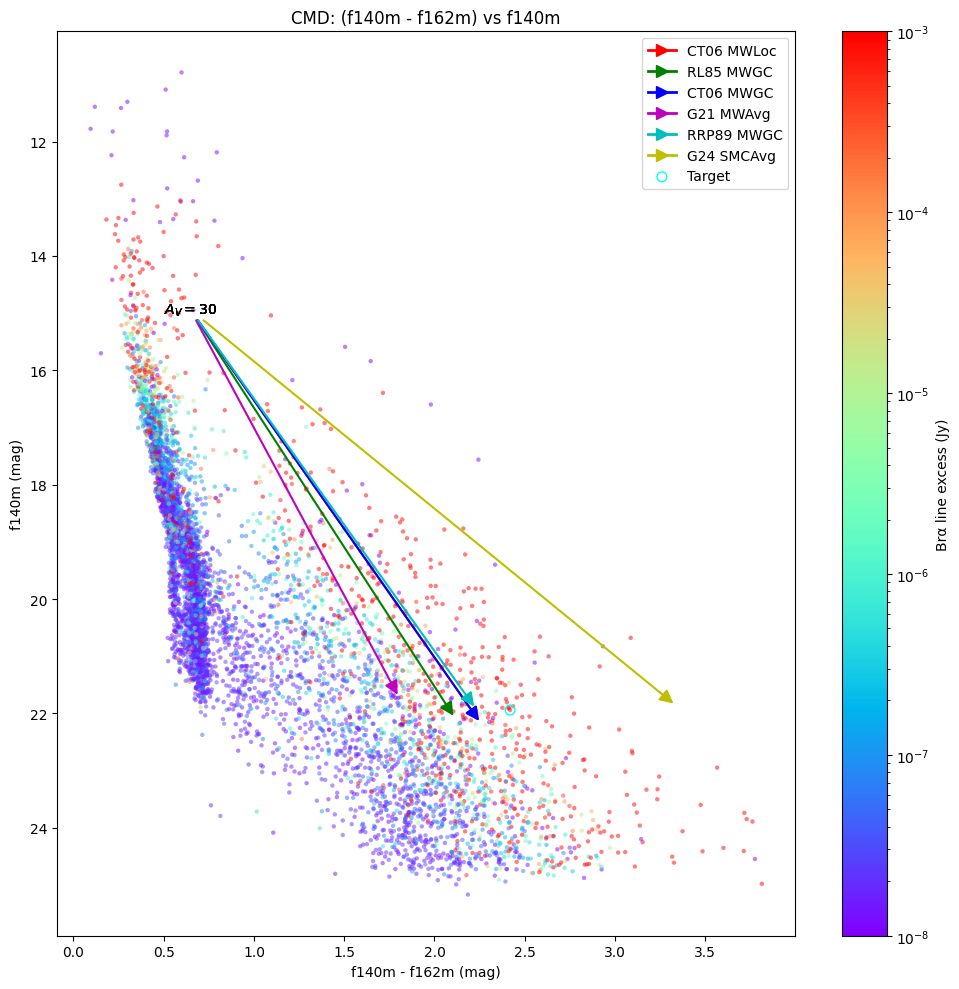

In [2]:
from astropy.coordinates import SkyCoord
from matplotlib.colors import LogNorm
ext = CT06_MWLoc()
# plot f140m-f162m color coded by f405n-f410m color
color = filters['f140m'][0] - filters['f162m'][0]
color_for_points = bra_excess

magnitude = filters['f140m'][0]


# Create plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)

#hb = ax.hexbin(color_valid, mag_valid, gridsize=100, cmap='inferno', mincnt=1, bins='log')
#cb = fig.colorbar(hb, ax=ax, label='log(N)')
cmap = plt.get_cmap('rainbow')

ax.scatter(color.value, magnitude.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))
ax.set_xlabel('f140m - f162m (mag)')
ax.set_ylabel('f140m (mag)')
ax.set_title(f'CMD: (f140m - f162m) vs f140m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f140m', 'f162m'), mag1=('f140m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
  



#add colorbar for the color coding
norm = LogNorm(vmin=1e-8, vmax=1e-3)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Brα line excess (Jy)')
plt.tight_layout()
#plt.savefig(f'{imgsavedir}cmd_{f1}_{f2}_vs_{mag_filter}.png', dpi=150)

skycoord_target = SkyCoord(ra=290.924875*u.deg, dec=14.5102237*u.deg, frame='icrs')
idx, d2d, _ = skycoord_target.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)

ax.scatter(color[idx].value, magnitude[idx].value, s=50, edgecolor='cyan', facecolor='none', marker='o', label='Target')
ax.legend()


plt.show()

3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6323076923076927 0.69 0.69
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6526084768147404 1.0894231111576114 1.0894231111576114
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.9293004729897925 0.9708737864077621 0.9708737864077621
3.6 um 4.8 um 4.8 um
Extinction vector not plotted: Input x outside of range defined for G24_SMCAvg [0.3 <= x <= 10.0, x has units 1/micron]


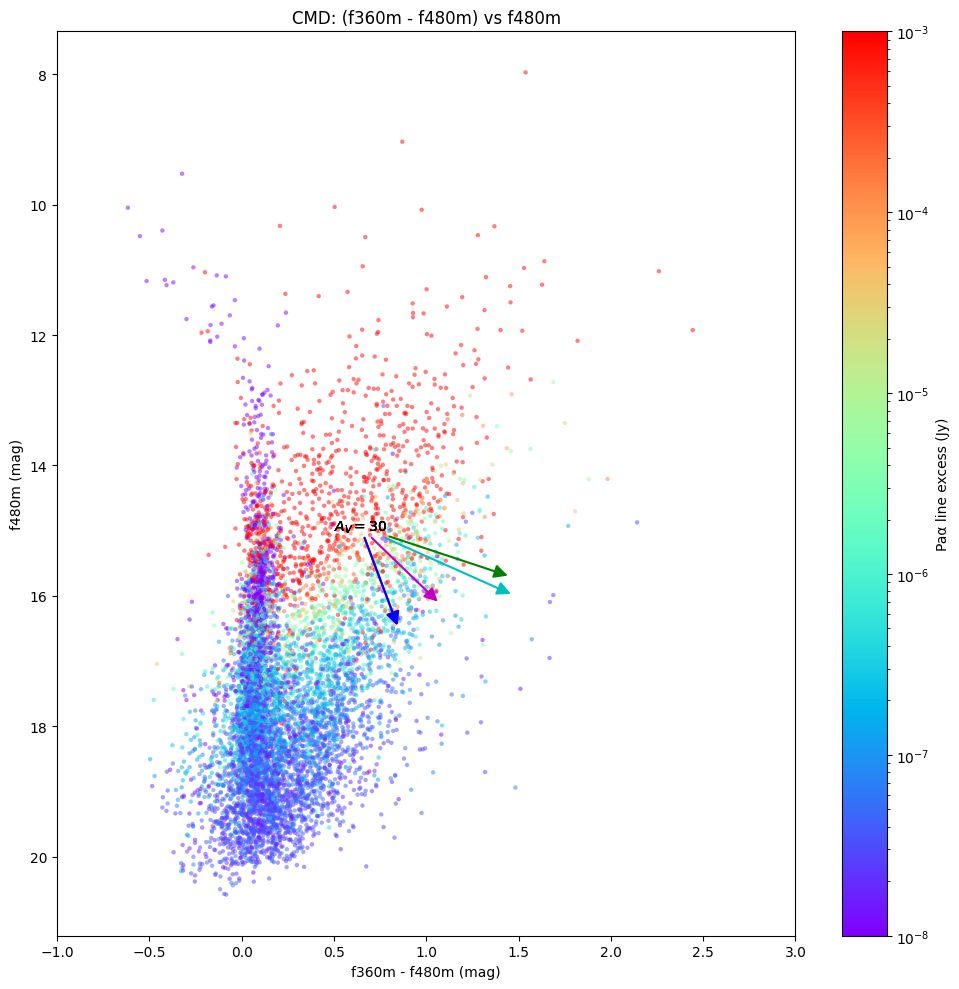

In [3]:
#f360-f480 vs f480-f560w, color coded by f187n-f182m (PaA excess)
color1 = filters['f360m'][0] - filters['f480m'][0]
mag1 = filters['f480m'][0]
color_for_points = paa_excess   
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('rainbow')
ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))     
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f480m (mag)')
ax.set_title(f'CMD: (f360m - f480m) vs f480m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f480m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
#add colorbar for the color coding
norm = LogNorm(vmin=1e-8, vmax=1e-3)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Paα line excess (Jy)')
ax.set_xlim(-1, 3)
plt.tight_layout()


3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6323076923076927 0.69 0.69
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6526084768147404 1.0894231111576114 1.0894231111576114
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.9293004729897925 0.9708737864077621 0.9708737864077621
3.6 um 4.8 um 4.8 um
Extinction vector not plotted: Input x outside of range defined for G24_SMCAvg [0.3 <= x <= 10.0, x has units 1/micron]


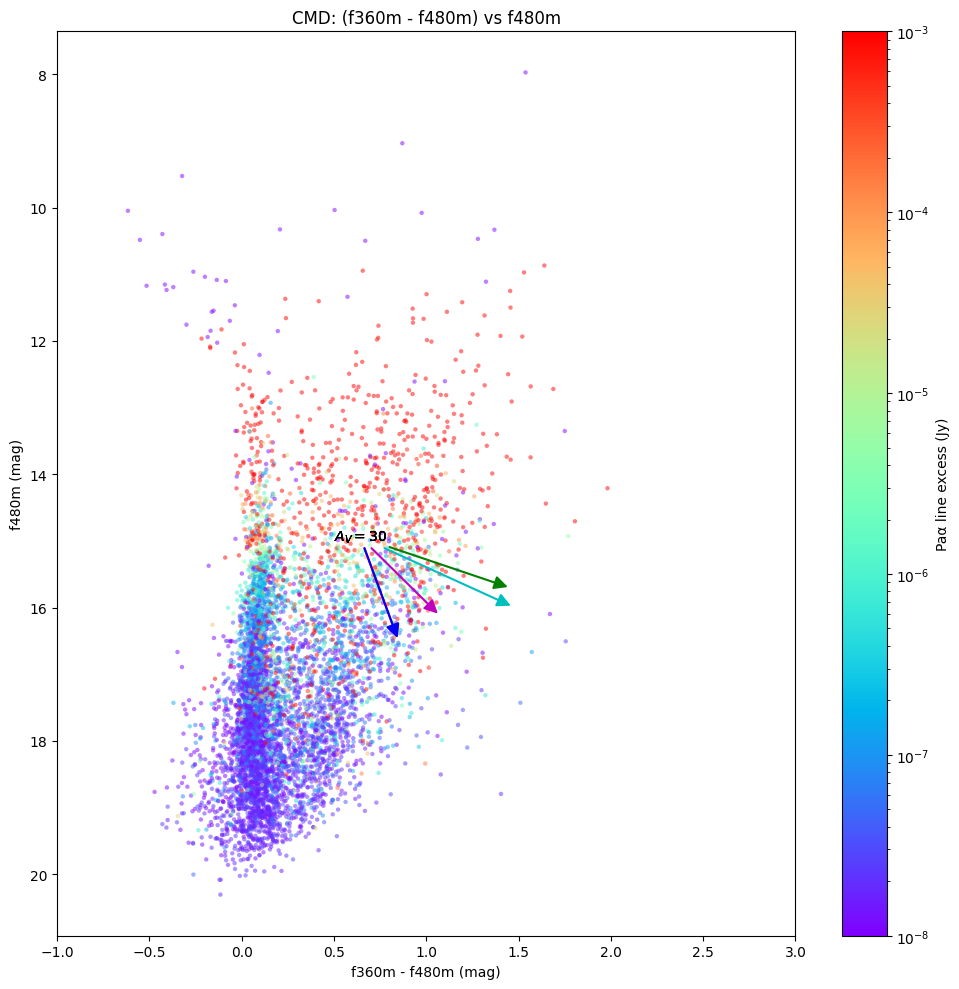

In [4]:
# same cmd color coded by Bra excess
color_for_points = bra_excess
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('rainbow')
ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f480m (mag)')
ax.set_title(f'CMD: (f360m - f480m) vs f480m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y'] 
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f480m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
#add colorbar for the color coding
norm = LogNorm(vmin=1e-8, vmax=1e-3)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Paα line excess (Jy)')
ax.set_xlim(-1, 3)
plt.tight_layout()


3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6323076923076927 0.69 0.69
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6526084768147404 1.0894231111576114 1.0894231111576114
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.9293004729897925 0.9708737864077621 0.9708737864077621
3.6 um 4.8 um 4.8 um
Extinction vector not plotted: Input x outside of range defined for G24_SMCAvg [0.3 <= x <= 10.0, x has units 1/micron]


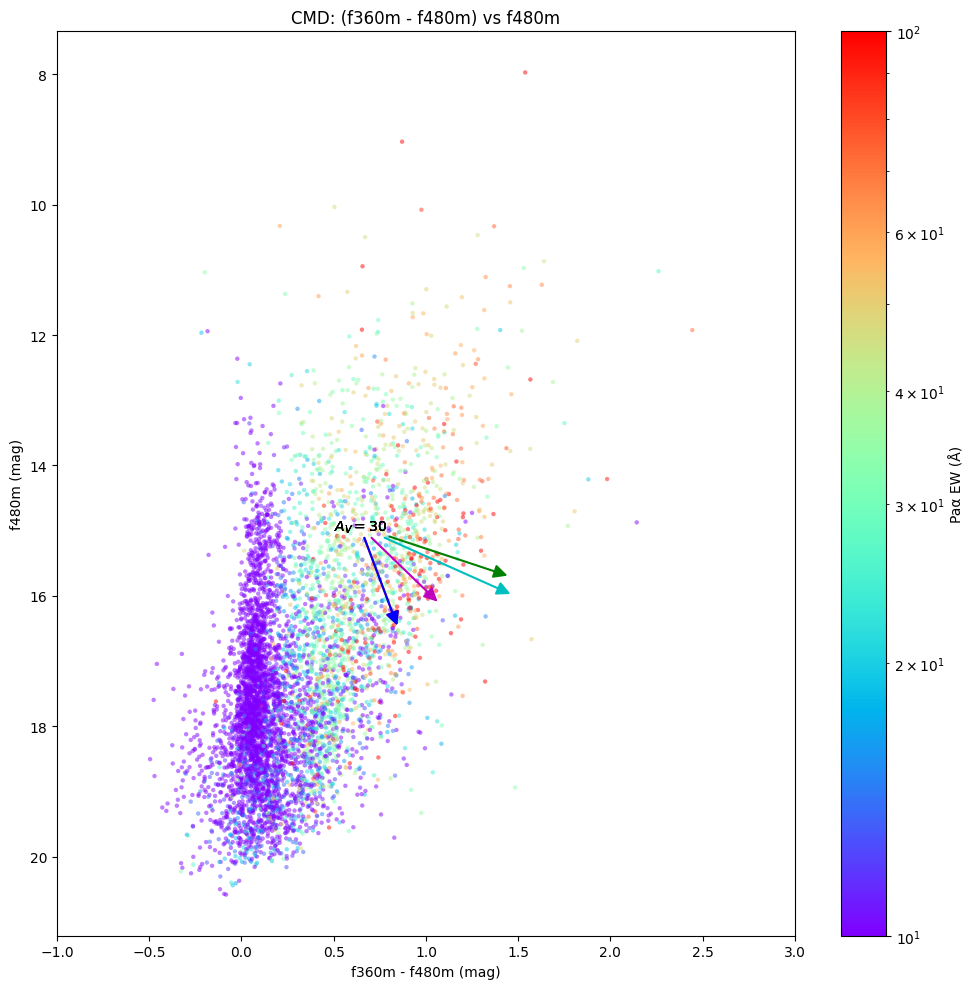

In [5]:
# same cmd for PaA EW
color_for_points = paa_excess_ew
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('rainbow')
norm = LogNorm(vmin=10, vmax=100)

ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',norm=norm)     
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f480m (mag)')
ax.set_title(f'CMD: (f360m - f480m) vs f480m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f480m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
#add colorbar for the color coding
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Paα EW (Å)')
ax.set_xlim(-1, 3)
plt.tight_layout()

3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6323076923076927 0.69 0.69
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.7993024000000004 1.454796 1.454796
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.6526084768147404 1.0894231111576114 1.0894231111576114
3.6 um 4.8 um 4.8 um
3.6 um 4.8 um 4.8 um
1.9293004729897925 0.9708737864077621 0.9708737864077621
3.6 um 4.8 um 4.8 um
Extinction vector not plotted: Input x outside of range defined for G24_SMCAvg [0.3 <= x <= 10.0, x has units 1/micron]


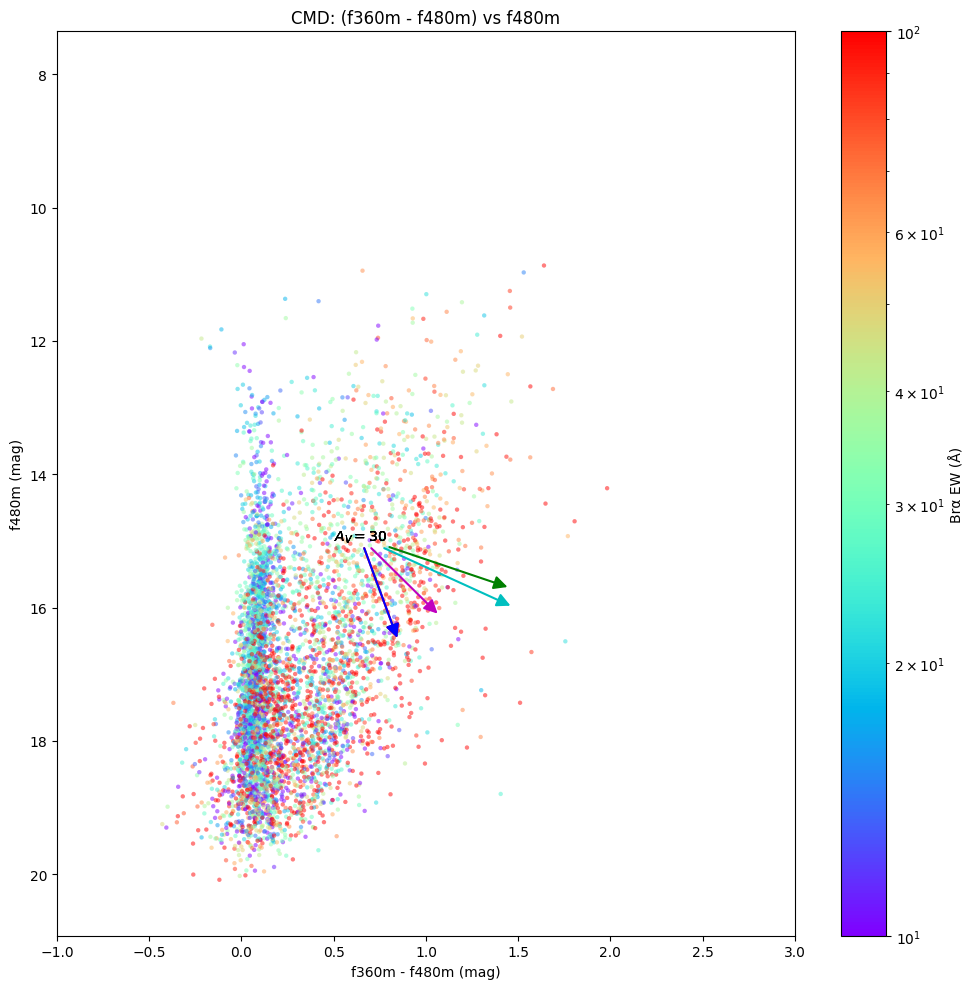

In [6]:
# same cmd with Bra EW
color_for_points = bra_excess_ew
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
cmap = plt.get_cmap('rainbow')
norm = LogNorm(vmin=10, vmax=100)
ax.scatter(color1.value, mag1.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none',norm=norm)
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f480m (mag)')
ax.set_title(f'CMD: (f360m - f480m) vs f480m')
ax.invert_yaxis()  # Invert y-axis for magnitude
from dust_extinction.averages import RL85_MWGC, CT06_MWLoc, G21_MWAvg,RRP89_MWGC, G24_SMCAvg
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']  
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    plot_extvec_cmd(ax, color1=('f360m', 'f480m'), mag1=('f480m',), 
                     ext=ext_model, extvec_scale=30, color=c, 
                     color1_data=color, mag1_data=magnitude, start=(0.5, 15), label=labels)
#add colorbar for the color coding
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Brα EW (Å)')
ax.set_xlim(-1, 3)
plt.tight_layout()

Model: CT06_MWLoc
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
7.129363200000001 5.382330074074073 1.7993024000000004 1.454796
Model: RL85_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
7.0412946428571415 5.4357638888888875 1.6323076923076927 0.69
Model: CT06_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
7.129363200000001 5.382330074074073 1.7993024000000004 1.454796
Model: G21_MWAvg
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
6.673350218462829 5.377005929042962 1.6526084768147404 1.0894231111576114
Model: RRP89_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 1.62 um 3.6 um 4.8 um
1.4 um 1.62 um 3.6 um 4.8 um
6.877352882900731 5.15745734947461 1.9293004729897925 

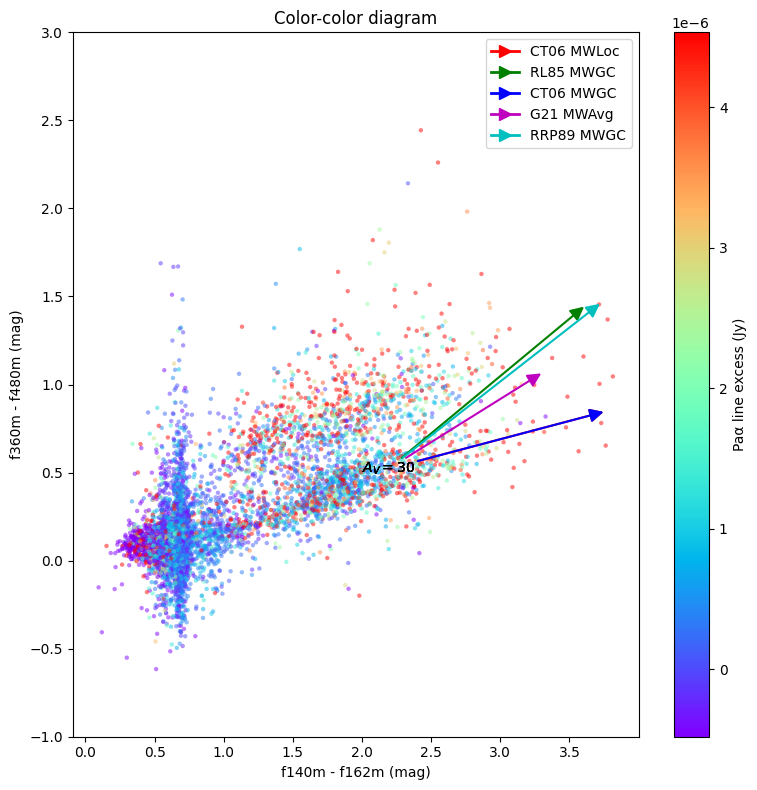

In [7]:
def plot_extvec_ccd(ax, color1, color2, ext=RL85_MWGC(), extvec_scale=30, start=None,
                    color='y', head_width=0.5, color1_data=None, color2_data=None, label=None):
    def get_wave(c):
        if c == '410m405': return 4.10*u.um
        if c == '405m410': return 4.05*u.um
        if c == 'Hmag': return 1.634*u.um
        if c == 'Ksmag': return 2.143527*u.um
        return int(c[1:-1])/100*u.um

    w1 = get_wave(color1[0])
    w2 = get_wave(color1[1])
    w3 = get_wave(color2[0])
    w4 = get_wave(color2[1])

    if w1 > w2:
        w1, w2 = w2, w1
        color1 = color1[::-1]
    if w3 > w4:
        w3, w4 = w4, w3
        color2 = color2[::-1]
    print(w1,w2,w3,w4)

    # Only plot if all are in valid range
    try:
        e_1 = ext(1/w1) * extvec_scale
        e_2 = ext(1/w2) * extvec_scale
        e_3 = ext(1/w3) * extvec_scale
        e_4 = ext(1/w4) * extvec_scale
    except ValueError as e:
        print(f"Extinction vector not plotted: {e}")
        return
    print(w1,w2,w3,w4)
    print(e_1, e_2, e_3, e_4)
    if start == None:
        mean_color1 = np.nanmean(color1_data)
        mean_color2 = np.nanmean(color2_data)
        std_color1 = np.nanstd(color1_data)
        std_color2 = np.nanstd(color2_data)
        if e_1 - e_2 < 0:
            std_color1 *= -1
        if e_3 - e_4 < 0:
            std_color2 *= -1
    
        start2 = (mean_color1 + 2*std_color1, mean_color2 + 2*std_color2)
    else:
        start2 = start

    ax.annotate(f'$A_V={extvec_scale}$', xy=(start2[0] + (e_1 - e_2), start2[1] + (e_3 - e_4)),
                xytext=(start2[0], start2[1]),
                arrowprops=dict(arrowstyle='-|>', color=color,
                                shrinkA=0, shrinkB=0,
                                mutation_scale=20, linewidth=1.5))
    
    ax.plot([], [], color=color, marker='>', markersize=8,
            label=f'{label}', linestyle='-', linewidth=2)

# 140-162 vs 360-480 color coded by paa excess
color1 = filters['f140m'][0] - filters['f162m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
color_for_points = paa_excess


fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
norm = plt.Normalize(vmin=np.nanpercentile(color_for_points, 10), vmax=np.nanpercentile(color_for_points, 90))
ax.scatter(color1.value, color2.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none', norm=norm)
ax.set_xlabel('f140m - f162m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Paα line excess (Jy)')
ax.set_ylim(-1,3)

colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    print(ext_model)
    plot_extvec_ccd(ax, color1=('f140m', 'f162m'), color2=('f360m', 'f480m'),
                     ext=ext_model, extvec_scale=30, color=c,
                     color1_data=color1, color2_data=color2, start=(2,0.5), label=labels)


ax.legend()
plt.tight_layout()
plt.show()


Model: CT06_MWLoc
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.129363200000001 3.4739712 1.7993024000000004 1.454796
Model: RL85_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.0412946428571415 3.6726315789473687 1.6323076923076927 0.69
Model: CT06_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
7.129363200000001 3.4739712 1.7993024000000004 1.454796
Model: G21_MWAvg
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
6.673350218462829 3.662529750810622 1.6526084768147404 1.0894231111576114
Model: RRP89_MWGC
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
1.4 um 2.1 um 3.6 um 4.8 um
1.4 um 2.1 um 3.6 um 4.8 um
6.877352882900731 3.598397287717673 1.9293004729897925 0.9708737864077621
Model:

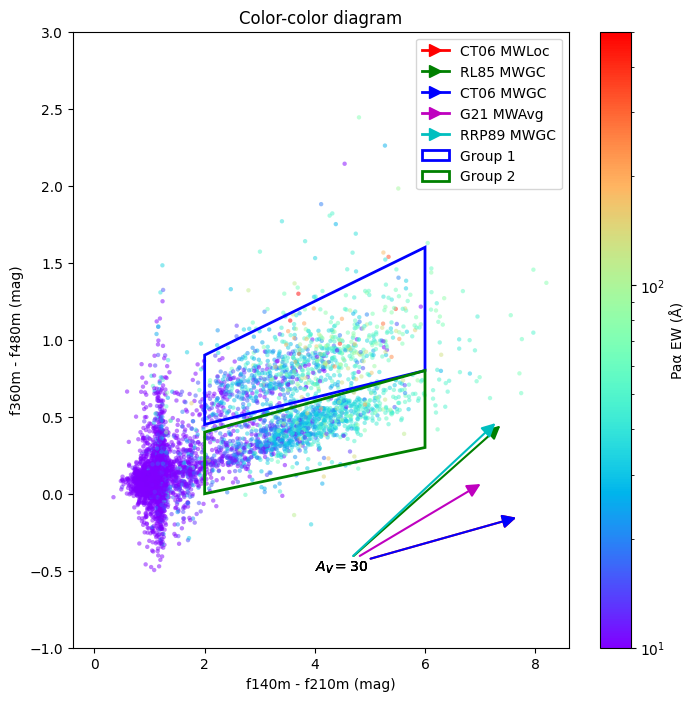

In [8]:
from matplotlib.path import Path
from matplotlib.patches import Polygon  
#color color diagram (F140M-F210M vs F360M-F480M) colored by PaA EW
color1 = filters['f140m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
color_for_points = paa_excess_ew
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
norm = LogNorm(vmin=10, vmax=5e2)
ax.scatter(color1.value, color2.value, s=10, c=color_for_points, cmap=cmap, alpha=0.5, edgecolor='none', norm=norm)
ax.set_xlabel('f140m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Paα EW (Å)')
ax.set_ylim(-1,3)
colorlist = ['r', 'g', 'b', 'm', 'c', 'y']
for ext_model, labels, c in zip([CT06_MWLoc(), RL85_MWGC(), CT06_MWGC(), G21_MWAvg(), RRP89_MWGC(), G24_SMCAvg()], ['CT06 MWLoc', 'RL85 MWGC', 'CT06 MWGC', 'G21 MWAvg', 'RRP89 MWGC', 'G24 SMCAvg'], colorlist):
    print(ext_model)
    plot_extvec_ccd(ax, color1=('f140m', 'f210m'), color2=('f360m', 'f480m'),
                     ext=ext_model, extvec_scale=30, color=c,
                     color1_data=color1, color2_data=color2, start=(4,-0.5), label=labels)   

vertices_upper = [(2,0.45), (2,0.9), (6, 1.6), (6, 0.8)]
vertices_lower = [(2,0), (2,0.4 ), (6, 0.8), (6, 0.3)]
polygon1 = Polygon(vertices_upper, closed=True, fill=False, edgecolor='blue', linewidth=2, label='Group 1')
polygon2 = Polygon(vertices_lower, closed=True, fill=False, edgecolor='green', linewidth=2, label='Group 2')
ax.add_patch(polygon1)
ax.add_patch(polygon2)
path1 = Path(vertices_upper)
idx1 = path1.contains_points(np.array([color1.value, color2.value]).T)

path2 = Path(vertices_lower)
idx2 = path2.contains_points(np.array([color1.value, color2.value]).T)
ax.legend()



Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

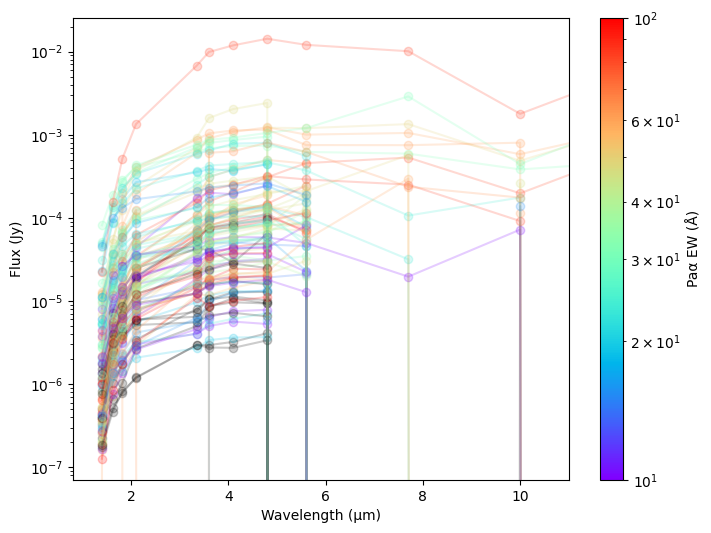

In [9]:
def plot_SED(catalog, idx_mask):
    fig, ax = plt.subplots(figsize=(8, 6))
    filter_names = ['f140m', 'f162m', 'f182m',  'f210m', 'f335m', 'f360m', 'f410m', 'f480m', 'f560w', 'f770w', 'f1000w', 'f1280w', 'f2100w']
    wavelengths = np.array([int(f[1:-1]) / 100 for f in filter_names]) * u.um

    src_idx = np.where(idx_mask)[0]   # convert boolean mask -> integer indices
    # get random 100 indices from src_idx
    if len(src_idx) > 100:
        src_idx = np.random.choice(src_idx, size=100, replace=False)
    # optional color normalization
    norm = LogNorm(vmin=10, vmax=100)
    cmap = plt.get_cmap("rainbow")

    for i in src_idx:
        flux_arr = []
        for filtername in filter_names:
            flux = (
                catalog['flux_fit_' + filtername][i] * u.MJy / u.sr
                * WCS(fits.getheader(image_filenames[filtername], ext=('SCI', 1))).proj_plane_pixel_area()
            ).to(u.Jy)
            flux_arr.append(flux.value)

        ax.plot(wavelengths.value, flux_arr, marker='o', alpha=0.2,
                color=cmap(norm(paa_excess_ew[i])))

    cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cbar.set_label('Paα EW (Å)')
    ax.set_yscale('log')
    ax.set_xlabel('Wavelength (µm)')
    ax.set_ylabel('Flux (Jy)')
    ax.set_xlim(0.8, 11)
    plt.show()
plot_SED(catalog, idx1)

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

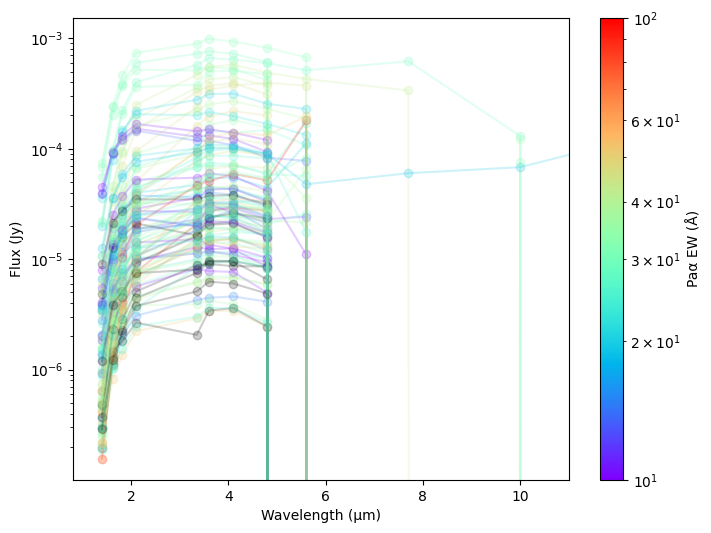

In [10]:
plot_SED(catalog, idx2)

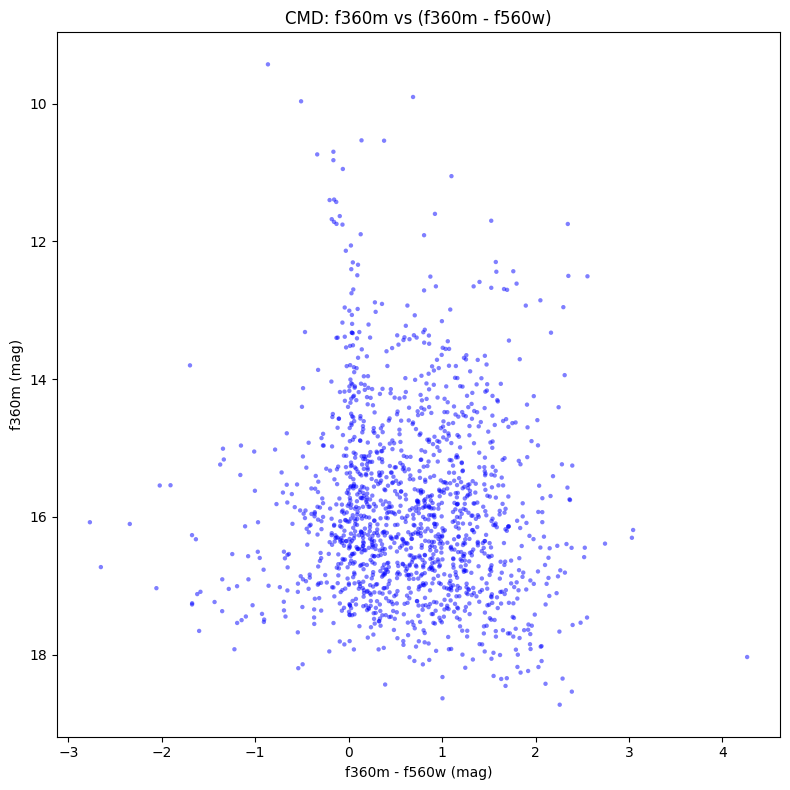

In [11]:
#plot f360 vs f360-f560w, with no color coding

mag = filters['f360m'][0]
color = filters['f360m'][0] - filters['f560w'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color.value, mag.value, s=10, c='blue', alpha=0.5, edgecolor='none')
ax.set_xlabel('f360m - f560w (mag)')
ax.set_ylabel('f360m (mag)')
ax.set_title('CMD: f360m vs (f360m - f560w)')
ax.invert_yaxis()  # Invert y-axis for magnitude
plt.tight_layout()

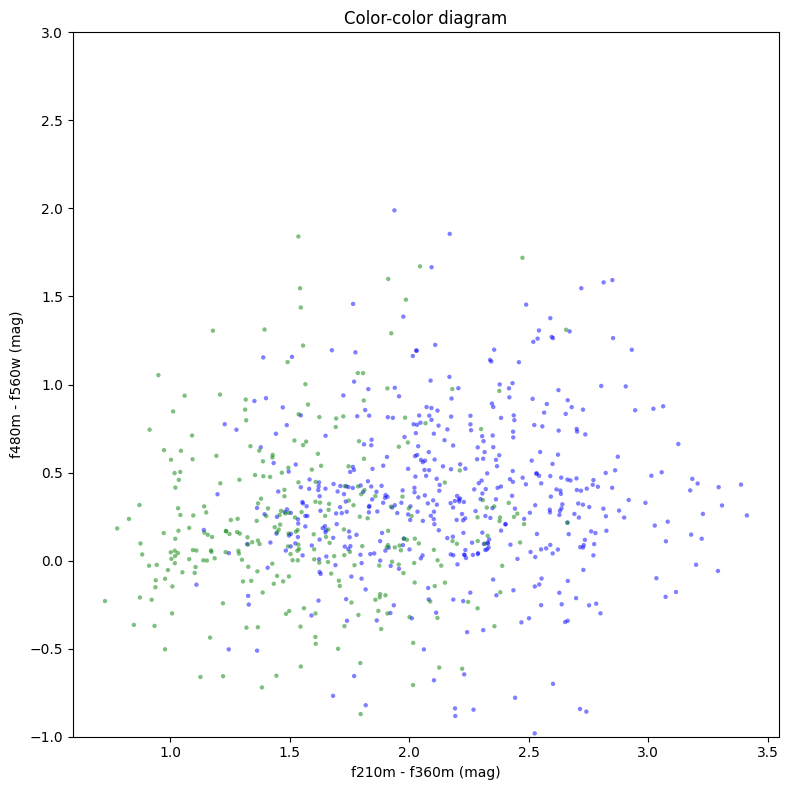

In [12]:
# 210-f360 vs 480-560
color1 = filters['f210m'][0] - filters['f360m'][0]
color2 = filters['f480m'][0] - filters['f560w'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value[idx1], color2.value[idx1], s=10, c='blue', alpha=0.5, edgecolor='none')
ax.scatter(color1.value[idx2], color2.value[idx2], s=10, c='green', alpha=0.5, edgecolor='none')
ax.set_xlabel('f210m - f360m (mag)')
ax.set_ylabel('f480m - f560w (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)
plt.tight_layout()

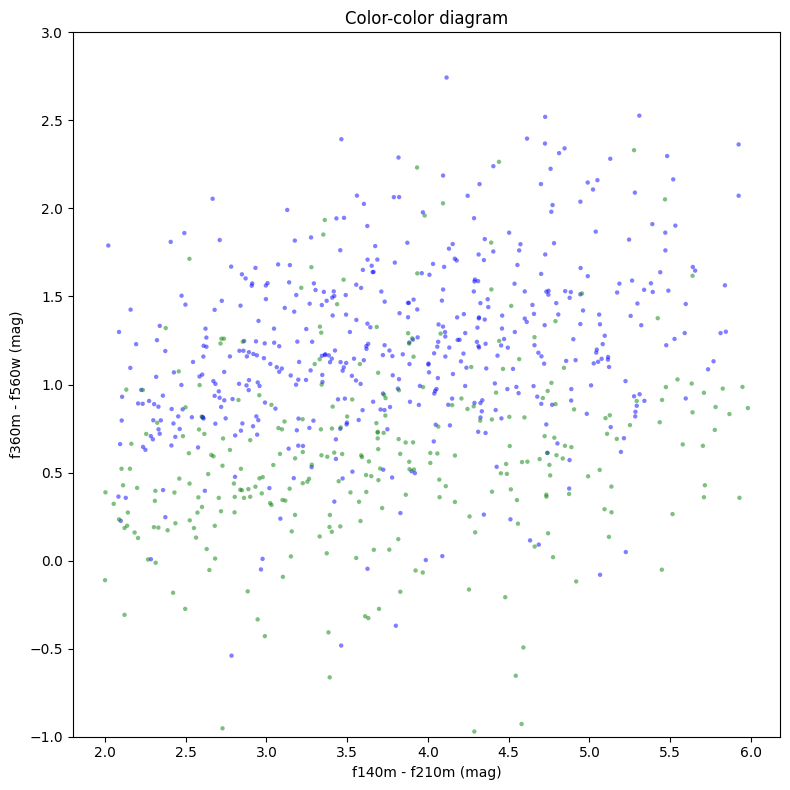

In [13]:
#140-210 vs 360-560
color1 = filters['f140m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f560w'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value[idx1], color2.value[idx1], s=10, c='blue', alpha=0.5, edgecolor='none')
ax.scatter(color1.value[idx2], color2.value[idx2], s=10, c='green', alpha=0.5, edgecolor='none')
ax.set_xlabel('f140m - f210m (mag)')
ax.set_ylabel('f360m - f560w (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)
plt.tight_layout()

(-1.0, 2.3)

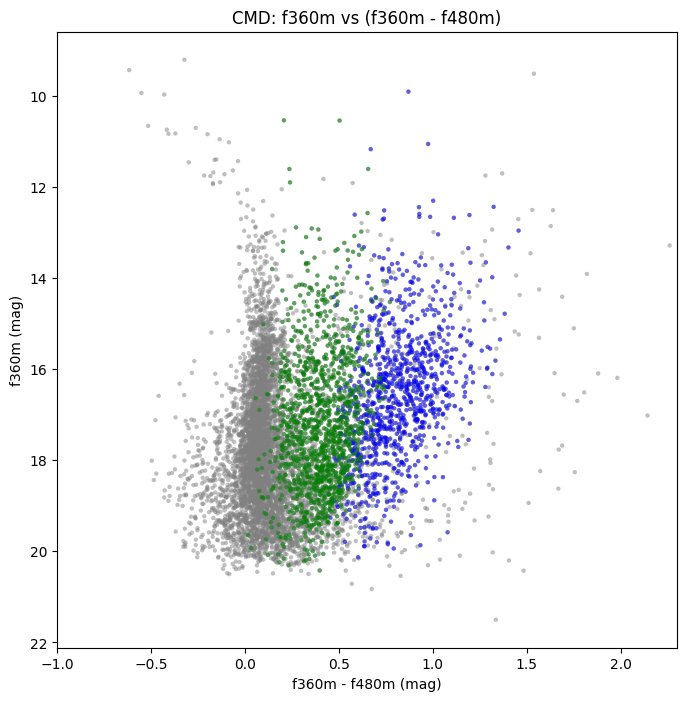

In [14]:
# plot 360-480 vs 360 and mark upper and lower branch pop
color1 = filters['f360m'][0] - filters['f480m'][0]
mag1 = filters['f360m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value, mag1.value, s=10, c='gray', alpha=0.5, edgecolor='none', label='All sources')
ax.scatter(color1.value[idx1], mag1.value[idx1], s=10, c='blue', alpha=0.5, edgecolor='none', label='Group 1')  
ax.scatter(color1.value[idx2], mag1.value[idx2], s=10, c='green', alpha=0.5, edgecolor='none', label='Group 2')
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('f360m (mag)')
ax.set_title('CMD: f360m vs (f360m - f480m)')
ax.invert_yaxis()  # Invert y-axis for magnitude
ax.set_xlim(-1, 2.3)

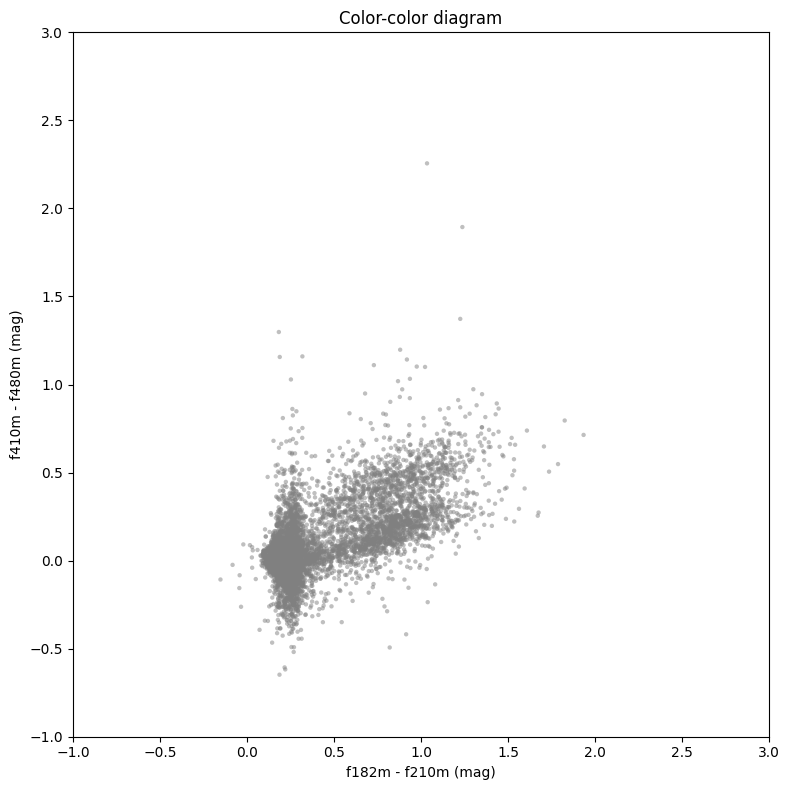

In [15]:
#182-210 vs 410 - 480
color1 = filters['f182m'][0] - filters['f210m'][0]
color2 = filters['f410m'][0] - filters['f480m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none', label='All sources')

ax.set_xlabel('f182m - f210m (mag)')
ax.set_ylabel('f410m - f480m (mag)')
ax.set_title('Color-color diagram')
ax.set_ylim(-1,3)
ax.set_xlim(-1,3)
plt.tight_layout()

[ True  True False False  True False]
Matched 3 out of 6 Kang+09 sources within 0.2 arcsec


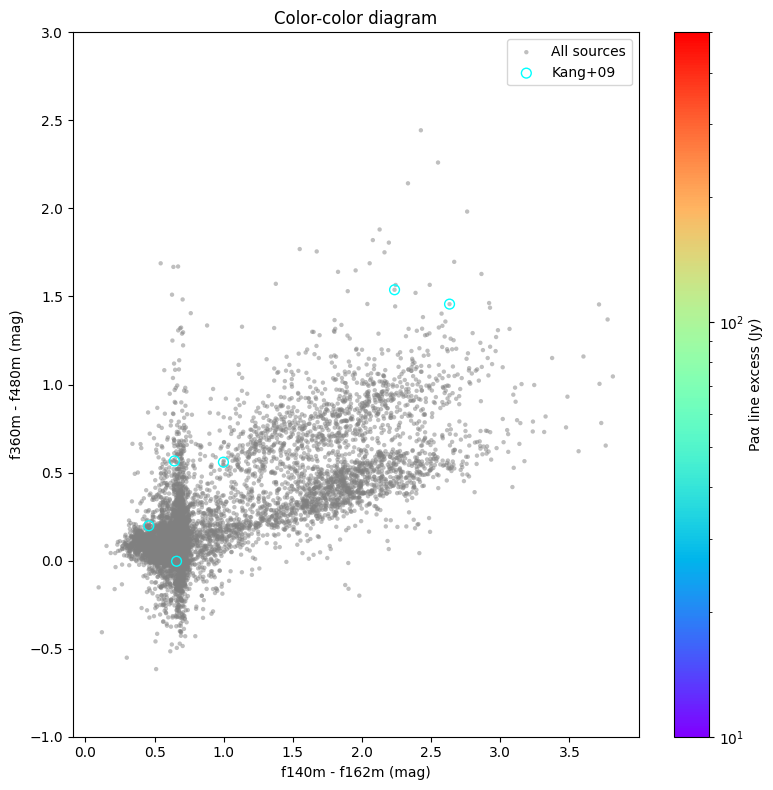

In [16]:
ra_kang09 = [290.9033,  290.92963, 290.950565, 290.949425, 290.956121, 290.95945 ]
dec_kang09 = [14.52127,  14.48092, 14.4915651, 14.50051, 14.47373, 14.47451]

skycoord_kang09 = SkyCoord(ra=ra_kang09*u.deg, dec=dec_kang09*u.deg, frame='icrs')
idx_kang09, d2d_kang09, _ = skycoord_kang09.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)
sep_lim = 0.2*u.arcsec
matched_kang09 = d2d_kang09 < sep_lim
print(matched_kang09)
print(f"Matched {np.sum(matched_kang09)} out of {len(skycoord_kang09)} Kang+09 sources within {sep_lim.to(u.arcsec)}")
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
color1 = filters['f140m'][0] - filters['f162m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none', label='All sources')
ax.scatter(color1.value[idx_kang09], color2.value[idx_kang09], s=50, edgecolor='cyan', facecolor='none', marker='o', label='Kang+09')
ax.set_xlabel('f140m - f162m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Paα line excess (Jy)')
ax.set_ylim(-1,3)
ax.legend()
plt.tight_layout()

     b6_xsky      
------------------
290.93232480562904
  290.932371860991
  290.932455642757
 290.9324648242179
 290.9322524991548
 290.9325841838294
290.93261402393324
 290.9312758073839
290.93236152972986
  290.932482038112
               ...
  290.927746466834
 290.9266458154624
 290.9228357244253
290.93990768503437
 290.9300258558489
290.92987320532956
290.92986114376197
 290.9259042913158
290.93038336645174
 290.9290577124884
Length = 118 rows
Matched 0 out of 118 W51e ALMA sources within 0.1 arcsec
Matched 2 out of 93 W51n ALMA sources within 0.1 arcsec


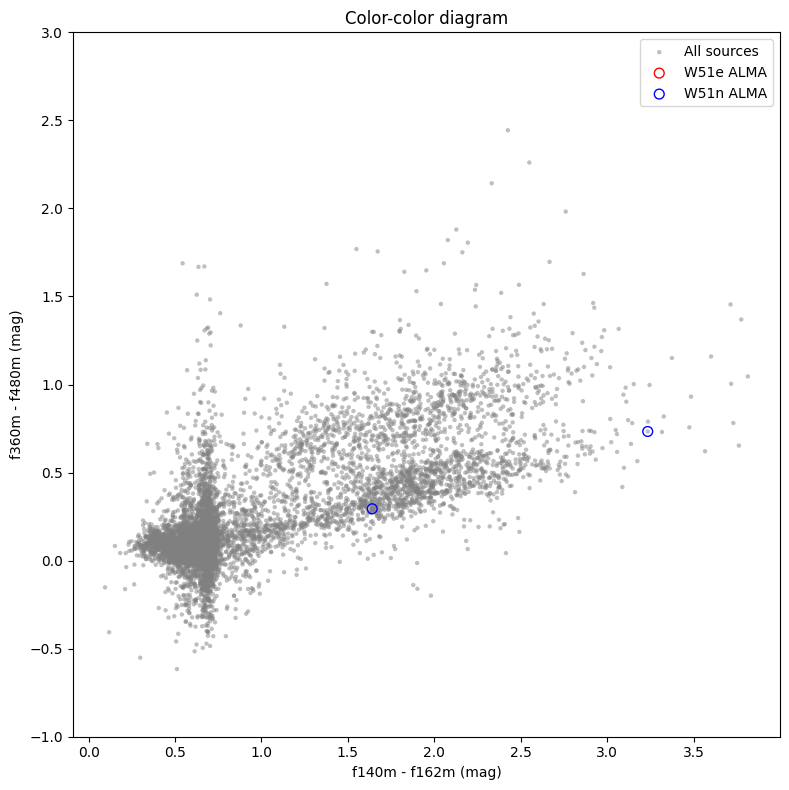

In [ ]:
w51e_alma_catalog_fn = '/orange/adamginsburg/w51/TaehwaYoo/dendro_w51e_matched_final.fits'

w51n_alma_catalog_fn = '/orange/adamginsburg/w51/TaehwaYoo/dendro_w51n_matched_final.fits'
w51e_alma_catalog = Table.read(w51e_alma_catalog_fn)
w51n_alma_catalog = Table.read(w51n_alma_catalog_fn)


#w51e_matched_idx = [3, 7, 36, 66, 67, 68, 76, 78, 93, 95, 106]
#w51n_matched_idx = [19, 22, 29, 30, 58, 59, 64, 66, 76, 89, 90, 91]
w51e_alma_b3_ra = w51e_alma_catalog['b3_xsky']
w51e_alma_b3_dec = w51e_alma_catalog['b3_ysky']
w51e_alma_b6_ra = w51e_alma_catalog['b6_xsky']
w51e_alma_b6_dec = w51e_alma_catalog['b6_ysky']
w51n_alma_b3_ra = w51n_alma_catalog['b3_xsky']
w51n_alma_b3_dec = w51n_alma_catalog['b3_ysky']
w51n_alma_b6_ra = w51n_alma_catalog['b6_xsky']
w51n_alma_b6_dec = w51n_alma_catalog['b6_ysky']


w51e_alma_ra = w51e_alma_b6_ra.copy()
w51e_alma_ra[w51e_alma_ra<0] = w51e_alma_b3_ra[w51e_alma_ra<0]
w51e_alma_dec = w51e_alma_b6_dec.copy()
w51e_alma_dec[w51e_alma_dec<0] = w51e_alma_b3_dec[w51e_alma_dec<0]
w51n_alma_ra = w51n_alma_b6_ra.copy()
w51n_alma_ra[w51n_alma_ra<0] = w51n_alma_b3_ra[w51n_alma_ra < 0]
w51n_alma_dec = w51n_alma_b6_dec.copy()
w51n_alma_dec[w51n_alma_dec<0] = w51n_alma_b3_dec[w51n_alma_dec<0]



skycoord_w51e_alma = SkyCoord(ra=w51e_alma_ra*u.deg, dec=w51e_alma_dec*u.deg, frame='icrs')

skycoord_w51n_alma = SkyCoord(ra=w51n_alma_ra*u.deg, dec=w51n_alma_dec*u.deg, frame='icrs')

print(w51e_alma_ra)
idx_w51e_alma, d2d_w51e_alma, _ = skycoord_w51e_alma.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)
alma_w51e_sep_lim = 0.1*u.arcsec
matched_w51e_alma = d2d_w51e_alma < alma_w51e_sep_lim
print(f"Matched {np.sum(matched_w51e_alma)} out of {len(skycoord_w51e_alma)} W51e ALMA sources within {alma_w51e_sep_lim.to(u.arcsec)}")    

idx_w51n_alma, d2d_w51n_alma, _ = skycoord_w51n_alma.match_to_catalog_sky(catalog['skycoord_ref'], nthneighbor=1)
alma_w51n_sep_lim = 0.1*u.arcsec
matched_w51n_alma = d2d_w51n_alma < alma_w51n_sep_lim
print(f"Matched {np.sum(matched_w51n_alma)} out of {len(skycoord_w51n_alma)} W51n ALMA sources within {alma_w51n_sep_lim.to(u.arcsec)}")
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
color1 = filters['f140m'][0] - filters['f162m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none', label='All sources')
ax.scatter(color1.value[idx_w51e_alma[matched_w51e_alma]], color2.value[idx_w51e_alma[matched_w51e_alma]], s=50, edgecolor='red', facecolor='none', marker='o', label='W51e ALMA')
ax.scatter(color1.value[idx_w51n_alma[matched_w51n_alma]], color2.value[idx_w51n_alma[matched_w51n_alma]], s=50, edgecolor='blue', facecolor='none', marker='o', label='W51n ALMA')
ax.set_xlabel('f140m - f162m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('Color-color diagram')

ax.set_ylim(-1,3)
ax.legend()
plt.tight_layout()

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


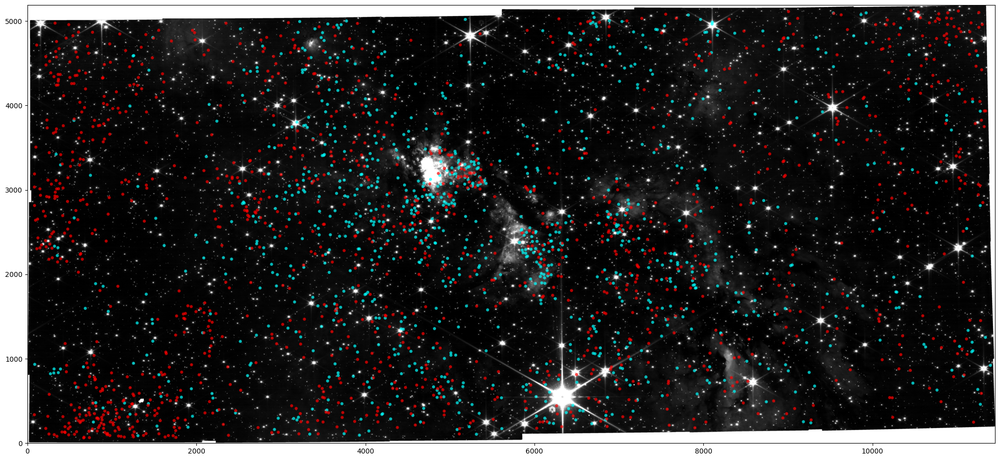

In [17]:
from astropy.visualization import simple_norm
# plot spatial distribution of the two groups
fig = plt.figure(figsize=(25,25))
ax = fig.add_axes(111)
skycoord = catalog['skycoord_ref']
pixcoord_f140m = WCS(fits.getheader(image_filenames['f140m'], ext=('SCI', 1))).world_to_pixel(skycoord)
img_f140m = fits.getdata(image_filenames['f140m'], ext=('SCI', 1))
norm = simple_norm(img_f140m, stretch='log', percent=99)
ax.imshow(img_f140m, origin='lower', cmap='gray', vmin=np.nanpercentile(img_f140m, 5), vmax=np.nanpercentile(img_f140m, 99))
ax.scatter(pixcoord_f140m[0][idx1], pixcoord_f140m[1][idx1], s=20, c='cyan', alpha=0.7, edgecolor='none', label='Group 1')
ax.scatter(pixcoord_f140m[0][idx2], pixcoord_f140m[1][idx2], s=20, c='red', alpha=0.7, edgecolor='none', label='Group 2')


/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/visualization/wcsaxes/core.py:248: UserWarning: The following kwargs were not used by contour: 'lwidths', 'label'
  cset = super().contour(*args, **kwargs)
/scratch/local/28789662/ipykernel_3424940/1806488463.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


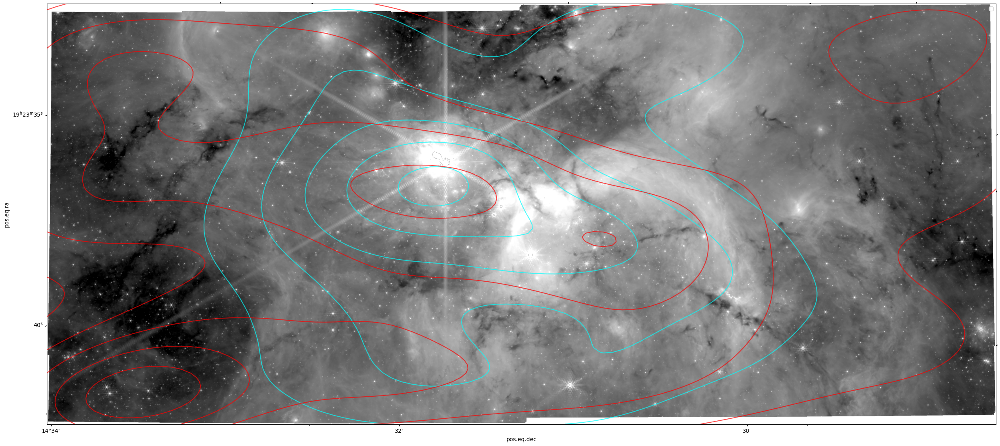

In [19]:
# make density contours for idx1 and idx2 in F480m image
from scipy.stats import gaussian_kde
pixcoord_f480m = WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))).world_to_pixel(skycoord)
img_f480m = fits.getdata(image_filenames['f480m'], ext=('SCI', 1))
x1 = pixcoord_f480m[0][idx1]
y1 = pixcoord_f480m[1][idx1]
x2 = pixcoord_f480m[0][idx2]    
y2 = pixcoord_f480m[1][idx2]
xy1 = np.vstack([x1, y1])
xy2 = np.vstack([x2, y2])
kde1 = gaussian_kde(xy1)
kde2 = gaussian_kde(xy2)
xgrid = np.linspace(0, img_f480m.shape[1], 100)
ygrid = np.linspace(0, img_f480m.shape[0], 100)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)
Z1 = kde1(np.vstack([Xgrid.ravel(), Ygrid.ravel()])).reshape(Xgrid.shape)
Z2 = kde2(np.vstack([Xgrid.ravel(), Ygrid.ravel()])).reshape(Xgrid.shape)
fig = plt.figure(figsize=(25,25))
ax = fig.add_axes(111,  projection=WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))))   
norm = simple_norm(img_f480m, stretch='log', percent=99)
ax.imshow(img_f480m, origin='lower', cmap='gray', norm=norm)
ax.contour(Xgrid, Ygrid, Z1, levels=5, colors='cyan', alpha=0.7, lwidths=4, label='upper branch')
ax.contour(Xgrid, Ygrid, Z2, levels=5, colors='red', alpha=0.7, lwidths=4, label='lower branch')
ax.legend()
plt.tight_layout()
plt.show()

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


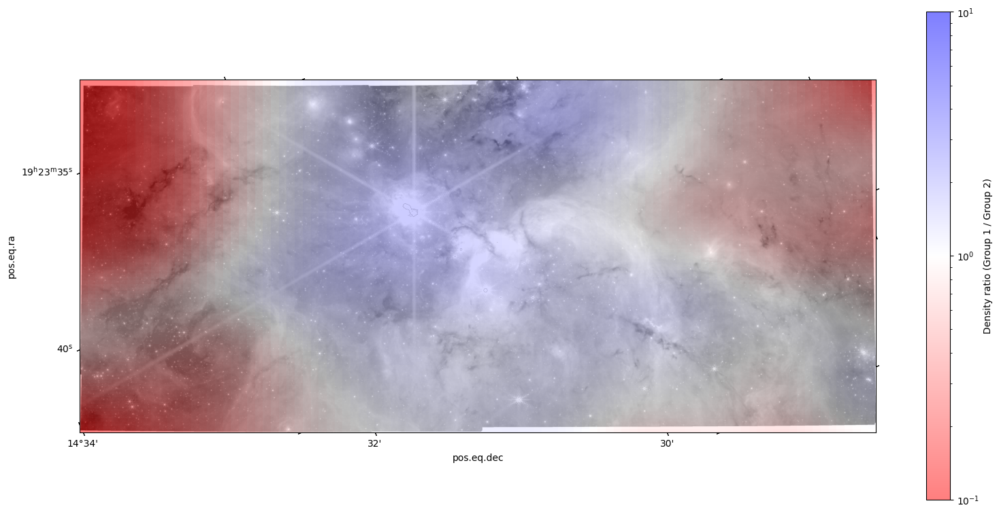

In [20]:
# make a 2d map of the density ratio Z1/Z2 to show where group 1 vs group 2 dominate
ratio = Z1 / (Z2 + 1e-10)

fig = plt.figure(figsize=(16,8))
ax = fig.add_axes(111, projection=WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))))
norm = simple_norm(img_f480m, stretch='log', percent=99)

ax.imshow(img_f480m, origin='lower', cmap='gray', norm=norm)

norm = LogNorm(vmin=0.1, vmax=10)
im = ax.imshow(
    ratio,
    origin='lower',
    cmap='bwr_r',
    alpha=0.5,
    norm=norm,
    extent=[xgrid.min(), xgrid.max(), ygrid.min(), ygrid.max()],  # key fix
    interpolation='nearest'
)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Density ratio (Group 1 / Group 2)')
plt.tight_layout()
plt.show()

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
/blue/adamginsburg/t.yoo/from_red/miniconda3/envs/py311/lib/python3.11/site-packages/astropy/visualization/wcsaxes/core.py:248: UserWarning: The following kwargs were not used by contour: 'label'
  cset = super().contour(*args, **kwargs)
/scratch/local/28789662/ipykernel_3424940/1752114106.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


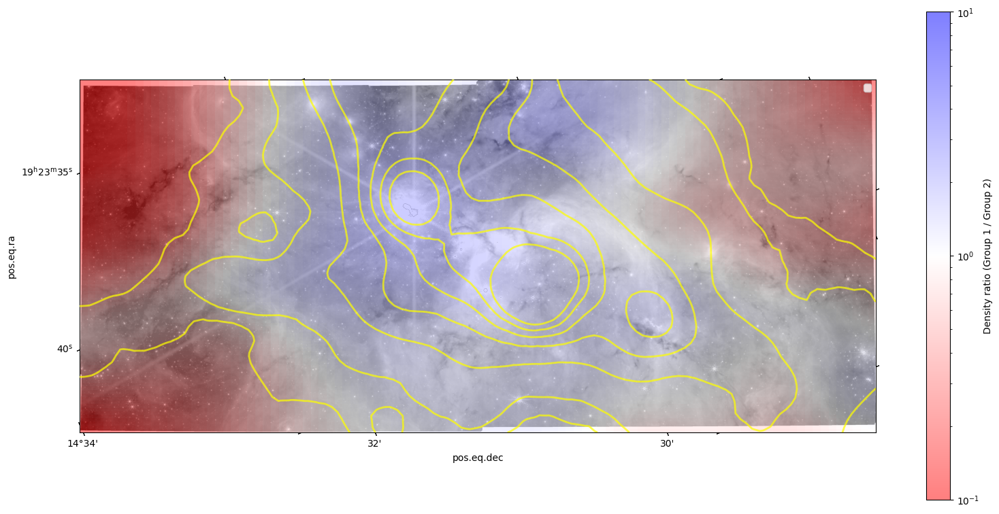

In [21]:
# make a 2d map of the density ratio Z1/Z2 to show where group 1 vs group 2 dominate
ratio = Z1 / (Z2 + 1e-10)

fig = plt.figure(figsize=(16,8))
ax = fig.add_axes(111, projection=WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))))
norm = simple_norm(img_f480m, stretch='log', percent=99)

ax.imshow(img_f480m, origin='lower', cmap='gray', norm=norm)

norm = LogNorm(vmin=0.1, vmax=10)
im = ax.imshow(
    ratio,
    origin='lower',
    cmap='bwr_r',
    alpha=0.5,
    norm=norm,
    extent=[xgrid.min(), xgrid.max(), ygrid.min(), ygrid.max()],  # key fix
    interpolation='nearest'
)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Density ratio (Group 1 / Group 2)')
co_planck_fn = '/orange/adamginsburg/jwst/w51/data_reprojected_480/co_planck_reprojected_to_f480m.fits'
co_plank = fits.getdata(co_planck_fn, ext=0)

# plot contour of co_planck on top at level of 2, 2.78, 5.11, 9.00, 14.44, 21.44, 30.0
co_planck_norm = simple_norm(co_plank, stretch='log', percent=99)
ax.contour(co_plank, levels=[2, 2.78, 5.11, 9.00, 14.44, 21.44, 30.0], colors='yellow', alpha=0.7, linewidths=2, label='Planck CO')
ax.legend()


plt.tight_layout()
plt.show()

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


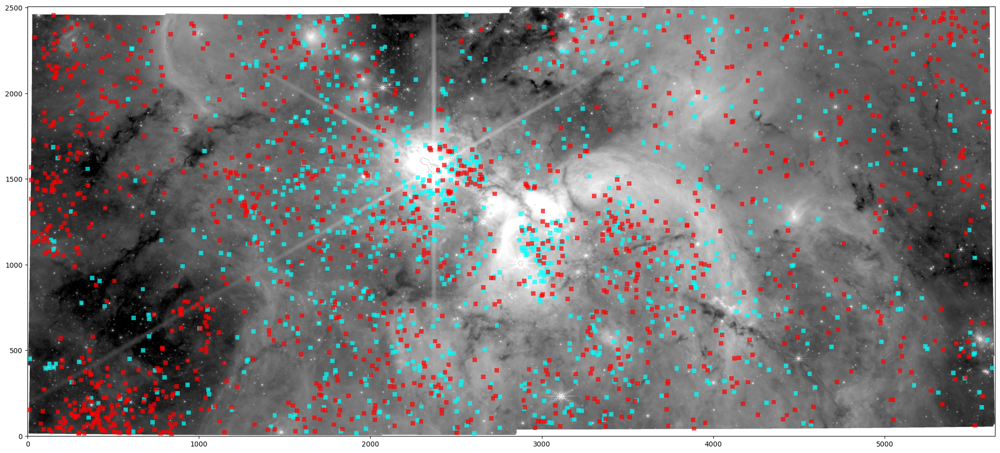

In [22]:
from astropy.visualization import simple_norm
# plot spatial distribution of the two groups
fig = plt.figure(figsize=(25,25))
ax = fig.add_axes(111)
skycoord = catalog['skycoord_ref']
pixcoord_f480m = WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1))).world_to_pixel(skycoord)
img_f480m = fits.getdata(image_filenames['f480m'], ext=('SCI', 1))
norm = simple_norm(img_f480m, stretch='log', percent=99)
ax.imshow(img_f480m, origin='lower', cmap='gray',norm=norm)
ax.scatter(pixcoord_f480m[0][idx1], pixcoord_f480m[1][idx1], s=40, c='cyan', marker='s', alpha=0.7, edgecolor='none', label='Group 1')
ax.scatter(pixcoord_f480m[0][idx2], pixcoord_f480m[1][idx2], s=40, c='red', marker='s', alpha=0.7, edgecolor='none', label='Group 2')


In [ ]:
catalog_upper_branch = catalog[idx1]
catalog_lower_branch = catalog[idx2]
catalog_upper_branch.write('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/catalog_upper_branch.fits', overwrite=True)
catalog_lower_branch.write('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/catalog_lower_branch.fits', overwrite=True)

In [ ]:
from regions import Regions
test_branch_reg = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51//catalogs//test_branch.reg')
skycoord_idx1 = catalog['skycoord_ref'][idx1]
skycoord_idx2 = catalog['skycoord_ref'][idx2]
wcs = WCS(fits.getheader(image_filenames['f140m'], ext=('SCI', 1)))
idx_of_idx1 = np.any([region.contains(skycoord_idx1, wcs=wcs) for region in test_branch_reg], axis=0)
idx_of_idx2 = np.any([region.contains(skycoord_idx2, wcs=wcs) for region in test_branch_reg], axis=0)



Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

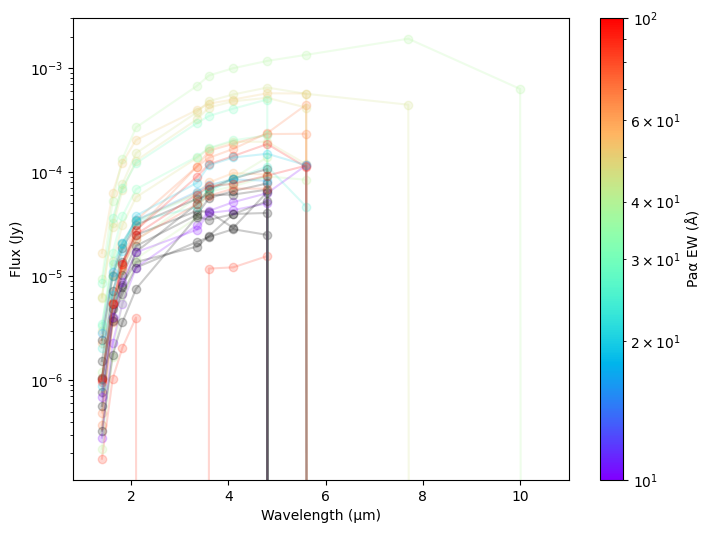

In [ ]:
mask_idx1_in_region = np.zeros(len(catalog), dtype=bool)
mask_idx1_in_region[idx1] = idx_of_idx1
plot_SED(catalog, mask_idx1_in_region)

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T15:11:59.611' from MJD-AVG.
Set DATE-END to '2025-05-06T15:35:36.878' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.237189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610816321.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2025-05-06T16:06:02.819' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE

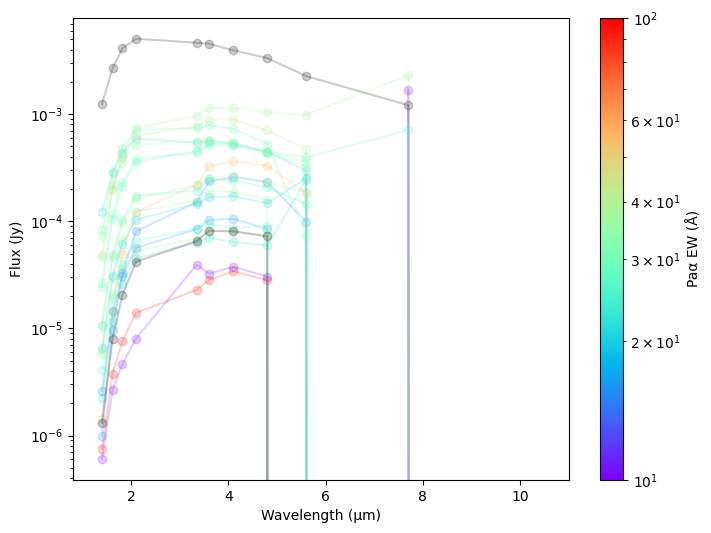

In [ ]:
mask_idx2_in_region = np.zeros(len(catalog), dtype=bool)
mask_idx2_in_region[idx2] = idx_of_idx2
plot_SED(catalog, mask_idx2_in_region)

(-1.0, 3.0)

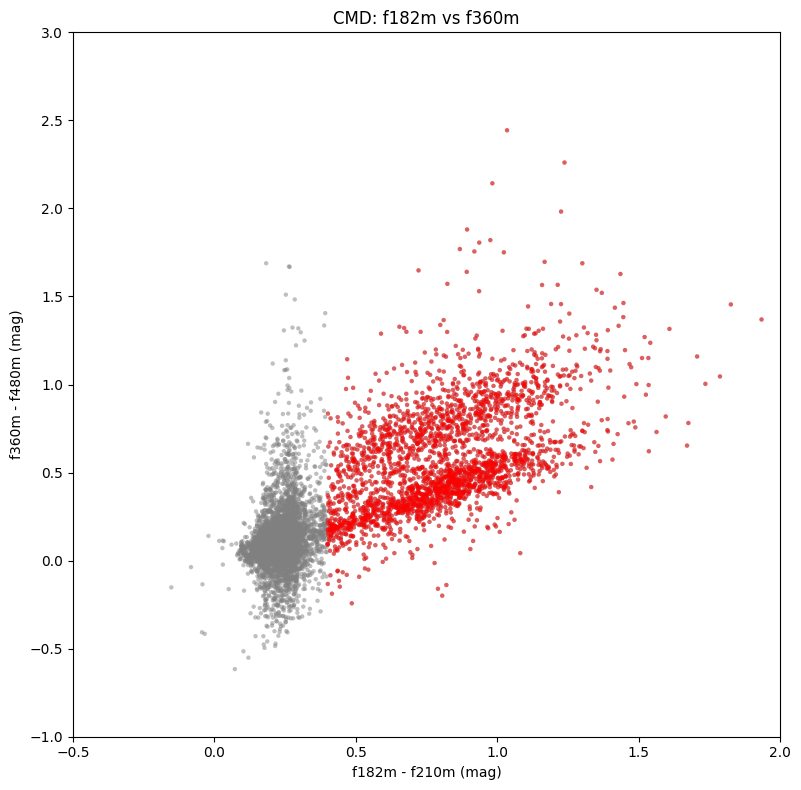

In [ ]:
# plot 182-210 vs 360-480, color coded by PaA excess
color1 = filters['f182m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none')

red_source = np.where(color1.value>0.4)[0]
ax.scatter(color1.value[red_source], color2.value[red_source], s=10, c='red', alpha=0.5, edgecolor='none', label='Red sources')

ax.set_xlabel('f182m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('CMD: f182m vs f360m')
ax.invert_yaxis()  # Invert y-axis for magnitude
plt.tight_layout()
ax.set_xlim(-0.5, 2)
ax.set_ylim(-1, 3)

 col1    col2    col3       col4          col5       col6   col7   col8   col9 col10 col11 col12  col13 col14 col15 col16 col17 col18   col19   col20  col21   col22    col23     col24     col25   col26   col27   col28  col29  col30  col31  col32  col33  col34  col35  col36  col37  col38  col39  col40  col41  col42  col43  col44  col45  col46  col47  col48  col49  col50 
------ ------- ------- -------------- ------------ ------- ------ ------ ----- ----- ----- ------ ----- ----- ----- ----- ----- ----- --------- ----- -------- ------ --------- --------- --------- ------ ------- ------- ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------
0.0207 0.15867     6.0   0.0908484459 1.0897678296   0.091  -1.33 3.4326 3.409     0   0.0  0.545   0.0   0.0   0.0   0.0   0.0    -1 -3.89e-14   0.0   0.6936 0.2855  0.003749  0.001011  0.009172   -1.0 0.02085   8.095  9.712  7.478  6.249  5.749  5.324 

(27.0, 5.0)

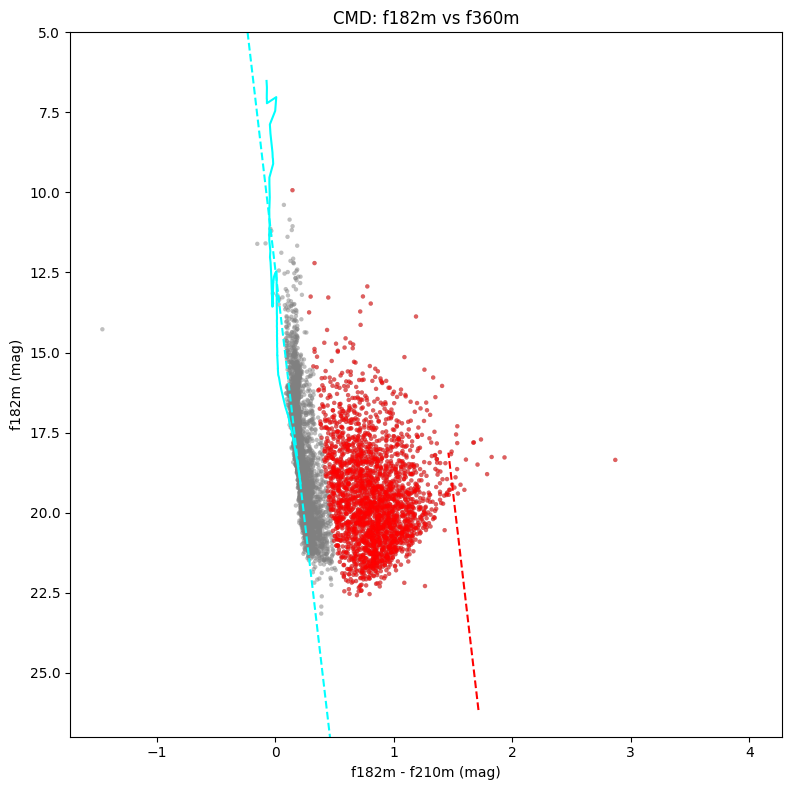

In [ ]:
# plot 182-210 vs 360-480, color coded by PaA excess
from astropy.table import Table
import crds
parsec_av0 = Table.read('/home/t.yoo/parsec_av0.txt', format='ascii')
parsec_av0.pprint(max_width=-1, max_lines=-1)   
m_init = parsec_av0['col4']  
parsec_av0 = parsec_av0[m_init<300]              
logage_av0 = parsec_av0['col3']
mass_av0 = parsec_av0['col6']
print(np.min(m_init), np.max(m_init))
print(np.min(mass_av0), np.max(mass_av0))
F140Mmag_av0 = parsec_av0['col39'] + 5*np.log10(5400)-5
F162Mmag_av0 = parsec_av0['col40']+ 5*np.log10(5400)-5
F182Mmag_av0 = parsec_av0['col41']+ 5*np.log10(5400)-5
F210Mmag_av0 = parsec_av0['col42']+ 5*np.log10(5400)-5
F335Mmag_av0 = parsec_av0['col45']+ 5*np.log10(5400)-5
F360Mmag_av0 = parsec_av0['col46']+ 5*np.log10(5400)-5
F410Mmag_av0 = parsec_av0['col47']+ 5*np.log10(5400)-5
F480Mmag_av0 = parsec_av0['col50']+ 5*np.log10(5400)-5

parsec_av10 = Table.read('/home/t.yoo/parsec_av10.txt', format='ascii')
logage_av10 = parsec_av10['col3']
mass_av10 = parsec_av10['col6']
F140Mmag_av10 = parsec_av10['col39']+ 5*np.log10(5400)-5
F162Mmag_av10 = parsec_av10['col40']+ 5*np.log10(5400)-5
F182Mmag_av10 = parsec_av10['col41']+ 5*np.log10(5400)-5
F210Mmag_av10 = parsec_av10['col42']+ 5*np.log10(5400)-5
F335Mmag_av10 = parsec_av10['col45']+ 5*np.log10(5400)-5
F360Mmag_av10 = parsec_av10['col46']+ 5*np.log10(5400)-5
F410Mmag_av10 = parsec_av10['col47']+ 5*np.log10(5400)-5
F480Mmag_av10 = parsec_av10['col50']+ 5*np.log10(5400)-5



color1 = filters['f182m'][0] - filters['f210m'][0]
mag1 = filters['f182m'][0] 
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
ax.scatter(color1.value, mag1.value, s=10, c='gray', alpha=0.5, edgecolor='none')
age_idx = logage_av0 == 6

ax.plot(F182Mmag_av0[age_idx] - F210Mmag_av0[age_idx], F182Mmag_av0[age_idx], color='cyan', label='PARSEC isochrones (A_V=0)')
idx_01msun = np.argmin(np.abs(mass_av0[age_idx]-0.1))
idx_20msun = np.argmin(np.abs(mass_av0[age_idx]-20))
isochrone_x_start = F182Mmag_av0[age_idx][idx_01msun] - F210Mmag_av0[age_idx][idx_01msun]
isochrone_x_end = F182Mmag_av0[age_idx][idx_20msun] - F210Mmag_av0[age_idx][idx_20msun]
isocrhone_y_start = F182Mmag_av0[age_idx][idx_01msun]
isocrhone_y_end = F182Mmag_av0[age_idx][idx_20msun]

A_K_scale = 5
A_V_scale = A_K_scale * 10
#ax.plot([isochrone_x_start, isochrone_x_end], [isocrhone_y_start, isocrhone_y_end], color='r', linestyle='--')
ax.plot([isochrone_x_start+(ext(1/1.82/u.um)-ext(1/2.10/u.um))*A_V_scale, isochrone_x_end+(ext(1/1.82/u.um)-ext(1/2.10/u.um))*A_V_scale], 
[isocrhone_y_start+(ext(1/1.82/u.um))*A_V_scale, isocrhone_y_end+(ext(1/1.82/u.um))*A_V_scale], color='r', linestyle='--')
# extrapolate the linear part of the isochrone to the left and right by 0.5 mag in color
color_slope = (isocrhone_y_end - isocrhone_y_start) / (isochrone_x_end - isochrone_x_start)
color_intercept = isocrhone_y_start - color_slope * isochrone_x_start
# and plot
x_vals = np.array([-1, 4])
y_vals = color_slope * x_vals + color_intercept
ax.plot(x_vals, y_vals, color='cyan', linestyle='--')
ext = CT06_MWLoc()

ax.set_xlabel('f182m - f210m (mag)')
ax.set_ylabel('f182m (mag)')
ax.set_title('CMD: f182m vs f360m')
ax.invert_yaxis()  # Invert y-axis for magnitude

red_source = np.where(color_slope*color1.value + color_intercept - mag1.value > 7)[0]
ax.scatter(color1.value[red_source], mag1.value[red_source], s=10, c='red', alpha=0.5, edgecolor='none', label='Red sources')

plt.tight_layout()
ax.set_ylim(27, 5)


In [ ]:
def get_av(color, mag, ext=RL85_MWGC(), color1=('f140m', 'f162m'), mag1=('f140m',), isochrone_line_params=(color_slope, color_intercept)):
    # Get the slope and intercept of the isochrone line
    m_iso, b_iso = isochrone_line_params

    # Get the extinction vector components
    w_color1_1 = int(color1[0][1:-1])/100*u.um
    w_color1_2 = int(color1[1][1:-1])/100*u.um
    w_mag1 = int(mag1[0][1:-1])/100*u.um
    print('w_color1_1:', w_color1_1, 'w_color1_2:', w_color1_2, 'w_mag1:', w_mag1)

    e_color1_1 = ext(1/w_color1_1)
    e_color1_2 = ext(1/w_color1_2)
    e_mag1 = ext(1/w_mag1)

    # get the contact to the isochrone line along the extinction vector
    # the extinction vector can be represented as a line with slope m_ext = e_mag1 / (e_color1_1 - e_color1_2) and passing through the point (color, mag)
    m_ext = e_mag1 / (e_color1_1 - e_color1_2)
    b_ext = mag - m_ext * color

    # find the intersection of the isochrone line and the extinction vector
    x_int = (b_ext - b_iso) / (m_iso - m_ext)
    y_int = m_iso * x_int + b_iso

    # calculate A_V as the distance from (color, mag) to (x_int, y_int) along the extinction vector
    av = (mag - y_int) / ext(1/w_mag1)
    av[av < 0] = 0
    return av
av_estimate = get_av(color.value, mag1.value, ext=CT06_MWLoc(), color1=('f182m', 'f210m'), mag1=('f182m',), isochrone_line_params=(color_slope, color_intercept))





w_color1_1: 1.82 um w_color1_2: 2.1 um w_mag1: 1.82 um


(-0.5, 2.0)

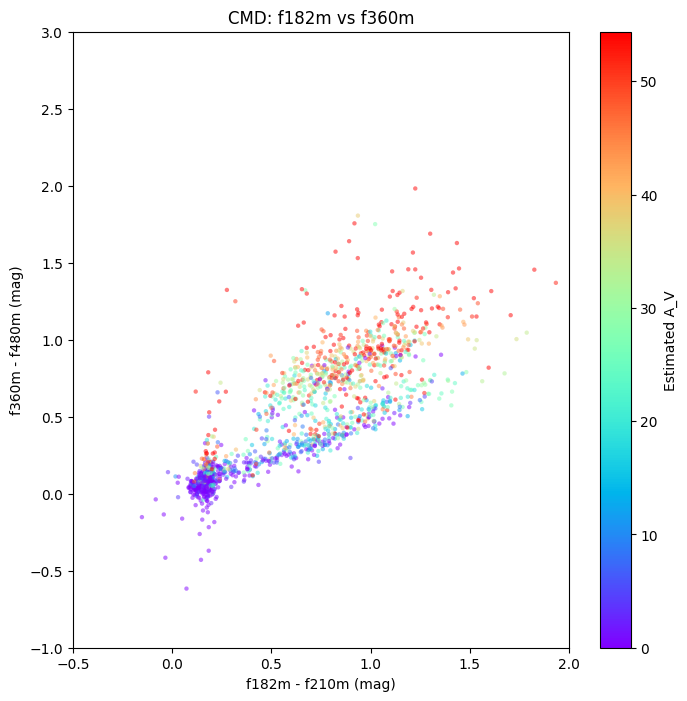

In [ ]:
# 182-210 vs 360-480, color coded by av_estimaters
color1 = filters['f182m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
cmap = plt.get_cmap('rainbow')
norm = plt.Normalize(vmin=np.nanpercentile(av_estimate, 10), vmax=np.nanpercentile(av_estimate, 90))
ax.scatter(color1.value, color2.value, s=10, c=av_estimate, cmap=cmap, alpha=0.5, edgecolor='none', norm=norm)
ax.set_xlabel('f182m - f210m (mag)')
ax.set_ylabel('f360m - f480m (mag)')
ax.set_title('CMD: f182m vs f360m')
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
cbar.set_label('Estimated A_V')
ax.set_ylim(-1,3)
ax.set_xlim(-0.5, 2)

Text(0, 0.5, 'number of sources')

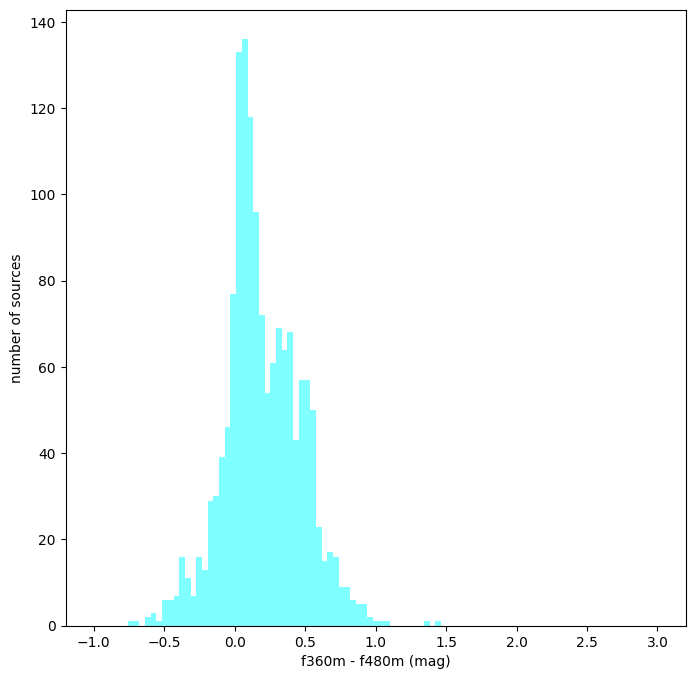

In [ ]:
#for each red sources, deredden it back to the isochrone using the extinction vector and plot the dereddened position in F182-f210 vs f360-f480 plot
color1 = filters['f182m'][0] - filters['f210m'][0]
color2 = filters['f360m'][0] - filters['f480m'][0]
mag1 = filters['f182m'][0]
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes(111)
#ax.scatter(color1.value, color2.value, s=10, c='gray', alpha=0.5, edgecolor='none')

ext = CT06_MWLoc()
df360f480 = av_estimate * (ext(1/3.60/u.um) - ext(1/4.80/u.um))
f360f480_dereddened = color2.value - df360f480

bin = np.linspace(-1, 3, 100)
ax.hist(f360f480_dereddened, bins=bin, alpha=0.5, color='cyan', label='Dereddened f360m-f480m')
ax.set_xlabel('f360m - f480m (mag)')
ax.set_ylabel('number of sources')

Best n_components (BIC): 4


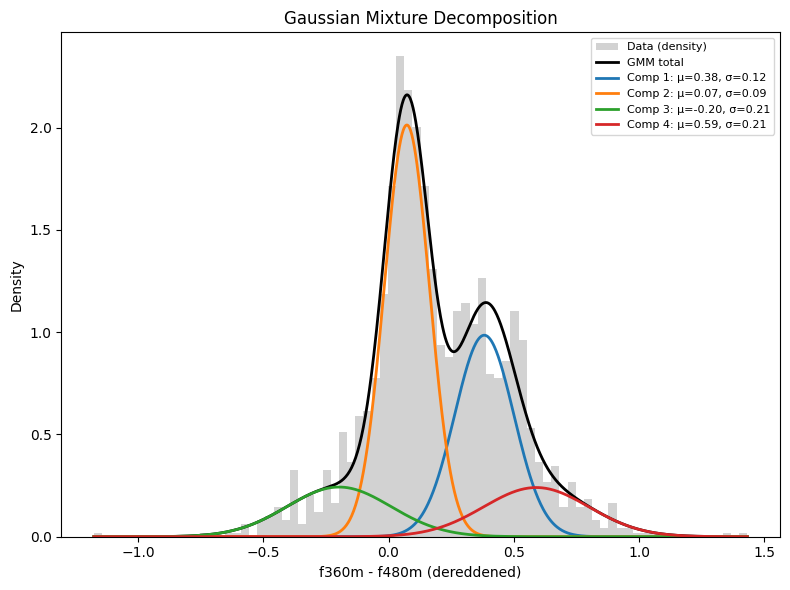

In [ ]:
from sklearn.mixture import GaussianMixture

# Use the dereddened color from the previous cell
x = np.asarray(f360f480_dereddened)
x = x[np.isfinite(x)].reshape(-1, 1)

# Pick number of Gaussian components by BIC
n_components_grid = range(1, 6)
models, bics = [], []
for k in n_components_grid:
    gmm_k = GaussianMixture(n_components=k, random_state=42)
    gmm_k.fit(x)
    models.append(gmm_k)
    bics.append(gmm_k.bic(x))

gmm = models[np.argmin(bics)]
print(f"Best n_components (BIC): {gmm.n_components}")

# Evaluate total PDF and each component PDF
xgrid = np.linspace(x.min(), x.max(), 1000).reshape(-1, 1)
logprob = gmm.score_samples(xgrid)
pdf = np.exp(logprob)
resp = gmm.predict_proba(xgrid)
pdf_components = resp * pdf[:, None]

# Plot histogram + GMM decomposition
fig, ax = plt.subplots(figsize=(8, 6))
ax.hist(x.ravel(), bins=80, density=True, alpha=0.35, color='gray', label='Data (density)')
ax.plot(xgrid, pdf, 'k-', lw=2, label='GMM total')

for i in range(gmm.n_components):
    ax.plot(
        xgrid, pdf_components[:, i],
        lw=2, label=f'Comp {i+1}: μ={gmm.means_[i,0]:.2f}, σ={np.sqrt(gmm.covariances_[i,0,0]):.2f}'
    )

ax.set_xlabel('f360m - f480m (dereddened)')
ax.set_ylabel('Density')
ax.set_title('Gaussian Mixture Decomposition')
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()